In [1]:

# ==========================================
# IMPORTS
# ==========================================
import h5py
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as T
from torch.utils.data import Dataset, DataLoader, random_split
from torch.cuda.amp import autocast, GradScaler
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import os
import warnings

# Suppress warnings
warnings.filterwarnings('ignore')

In [2]:
# # ==========================================
# # KAGGLE DATA SOURCE (Keep if running on Kaggle)
# # ==========================================
# try:
#     import kagglehub
#     ijlalahmed10_galaxy10_decals_path = kagglehub.dataset_download('ijlalahmed10/galaxy10-decals')
#     print('Data source import complete.')
# except:
#     print('Kagglehub not available, assuming local environment.')

# # ==========================================

In [3]:
# 1. HYPERPARAMETERS (Optimized and Fixed)
# ==========================================
CONFIG = {
    'batch_size': 128,        # Increased for speed. If OOM, drop to 128.
    'lr': 5e-5,               # Base learning rate
    'lambda_sigreg': 0.6,
    'warmup_epochs': 5,       # Learning rate warmup
    'weight_decay': 0.05,
    'epochs': 100,             
    'img_size': 224,
    'embed_dim': 192,
    'num_heads': 3,
    'enc_depth': 6,
    'pred_depth': 6,
    'patch_size': 16,
    'device': 'cuda' if torch.cuda.is_available() else 'cpu',
    'mask_scale': (0.2, 0.5),
    'context_scale': (0.4, 0.8),
    'num_targets': 4,         # Number of target blocks
    'ema_momentum_base': 0.996,  # Will be adjusted based on epochs
    'patience': 10,           # Early stopping patience
    'min_context_patches': 20,  # Minimum visible patches in context
    'center_crop_size': 140,  # Crop size for galaxies
}
# Adjust EMA momentum based on training length
if CONFIG['epochs'] < 100:
    CONFIG['ema_momentum'] = 0.99  # Lower momentum for shorter training
else:
    CONFIG['ema_momentum'] = CONFIG['ema_momentum_base']

print(f"Running on: {CONFIG['device']}")
print(f"Training for {CONFIG['epochs']} epochs with EMA momentum: {CONFIG['ema_momentum']}")

Running on: cuda
Training for 100 epochs with EMA momentum: 0.996


In [4]:

# ==========================================
# 2. DATASET
# ==========================================
class Galaxy10FullDataset(Dataset):
    """
    Galaxy10 Dataset that loads all data into RAM for fast training.
    """
    def __init__(self, file_path, transform=None):
        self.transform = transform
        
        if not os.path.exists(file_path):
            raise FileNotFoundError(f"Dataset file not found: {file_path}")

        try:
            print(f"Loading {file_path} into RAM...")
            with h5py.File(file_path, "r") as f:
                self.images = f["images"][:]  # Shape: (N, 256, 256, 3)
                self.labels = f["ans"][:]
            
            # Ensure correct type for PIL (0-255 uint8)
            self.images = self.images.astype(np.uint8)
            self.N = len(self.images)
            print(f"✓ Loaded {self.N} images into RAM. Ready to train.")
            
        except Exception as e:
            raise RuntimeError(f"Failed to load dataset: {str(e)}")

    def __len__(self):
        return self.N

    def __getitem__(self, idx):
        img = self.images[idx]
        label = self.labels[idx]

        # Convert to PIL Image for torchvision transforms
        img = Image.fromarray(img)

        if self.transform:
            img = self.transform(img)

        return img, int(label)


class TransformDataset(Dataset):
    """
    Wraps any dataset or subset and applies a new transform
    without modifying the original dataset.
    """
    def __init__(self, subset, transform):
        self.subset = subset
        self.transform = transform

    def __len__(self):
        return len(self.subset)

    def __getitem__(self, idx):
        item = self.subset[idx]

        if isinstance(item, tuple):
            img, label = item
            return self.transform(img), label

        return self.transform(item)



In [5]:
import torch
import numpy as np

# ==========================================
# 3. MASKING UTILITIES (Galaxy-aware JEPA)
# ==========================================
class IJepaMaskCollator:
    """
    Galaxy-aware masking collator for Mini-JEPA on Galaxy10.

    Returns:
        images:        (B, C, H, W)
        context_mask:  (B, N) bool, True = visible to context encoder
        target_masks:  list of length num_targets, each (B, N) bool, True = target block
    """

    def __init__(
        self,
        input_size=224,
        patch_size=32,
        enc_mask_scale=(0.4, 0.8),   # size of VISIBLE context block, in fraction of grid dims
        pred_mask_scale=(0.2, 0.3),  # size of each TARGET block, in fraction of grid dims
        num_targets=4,
        min_context_patches=10
    ):
        self.input_size = input_size
        self.patch_size = patch_size

        self.H = input_size // patch_size   # patch grid height
        self.W = input_size // patch_size   # patch grid width
        self.N = self.H * self.W

        self.enc_mask_scale = enc_mask_scale
        self.pred_mask_scale = pred_mask_scale
        self.num_targets = num_targets
        self.min_context_patches = min_context_patches

    # ------------------------------------------------------
    def __call__(self, batch):
        """
        batch: list of (image, label) or (image,)
        """
        # Extract images only
        images = torch.stack([item[0] for item in batch])  # (B, C, H, W)
        B = images.shape[0]

        # 1. Compute brightness per patch (so we know where the galaxy actually is)
        brightness = self._compute_patch_brightness(images)  # (B, H, W)

        # 2. Sample target masks (what the predictor must reconstruct)
        target_masks = []
        for _ in range(self.num_targets):
            t_mask = self._sample_semantic_block(brightness, self.pred_mask_scale)  # (B, N)
            target_masks.append(t_mask)

        # Combine all target blocks
        full_target_mask = torch.stack(target_masks, dim=0).any(dim=0)  # (B, N)

        # 3. Sample context mask (what the context encoder sees)
        #    This block represents the VISIBLE region.
        context_mask = self._sample_semantic_block(brightness, self.enc_mask_scale)  # (B, N)

        # Remove any overlap with target blocks
        context_mask = context_mask & (~full_target_mask)

        # 4. Ensure enough context patches remain
        for b in range(B):
            if context_mask[b].sum() < self.min_context_patches:
                # Fallback: allow every non-target patch to be context
                context_mask[b] = ~full_target_mask[b]
                # Still possible this is all False if target covers everything,
                # but with reasonable scales that should never happen.

        return images, context_mask, target_masks

    # ------------------------------------------------------
    def _compute_patch_brightness(self, imgs):
        """
        Compute mean absolute brightness per patch.

        imgs: (B, C, H, W), normalized, can be in [-1,1] or similar.
        Returns: (B, H_patches, W_patches)
        """
        B, C, H, W = imgs.shape
        assert H == self.input_size and W == self.input_size, \
            f"Expected images of size {self.input_size}x{self.input_size}, got {H}x{W}"

        # Approx "grayscale" intensity
        gray = imgs.mean(dim=1).abs()  # (B, H, W)

        # Fold into patches of size patch_size x patch_size
        p = self.patch_size
        Hp = H // p
        Wp = W // p

        # unfold: (B, Hp, Wp, p, p)
        patches = gray.unfold(1, p, p).unfold(2, p, p)
        # Mean brightness per patch
        brightness = patches.mean(dim=(-1, -2))  # (B, Hp, Wp)

        return brightness

    # ------------------------------------------------------
    def _sample_semantic_block(self, brightness, scale):
        """
        Sample a block of patches per image, biased toward bright (galaxy) regions.

        brightness: (B, H, W)
        scale: (min_frac, max_frac) of grid dims for block size
        Returns:
            mask: (B, N) bool, True where block is active (visible or target)
        """
        B, H, W = brightness.shape
        mask = torch.zeros(B, H, W, dtype=torch.bool)

        min_s, max_s = scale

        for b in range(B):
            br = brightness[b]  # (H, W)

            # pick block size as a fraction of grid dims
            block_h = np.random.randint(
                max(1, int(H * min_s)),
                max(1, int(H * max_s)) + 1
            )
            block_w = np.random.randint(
                max(1, int(W * min_s)),
                max(1, int(W * max_s)) + 1
            )

            # probability from brightness
            prob = br.flatten()  # (H*W,)

            # sanitize probs
            prob = torch.nan_to_num(prob, nan=0.0, posinf=0.0, neginf=0.0)
            prob = torch.clamp(prob, min=0.0)

            if prob.sum() <= 0:
                # if galaxy is very faint, fall back to uniform
                prob = torch.ones_like(prob)

            prob = prob / prob.sum()

            # sample center location
            idx = torch.multinomial(prob, 1).item()
            cy = idx // W
            cx = idx % W

            #NO brightness bias for second 200 epochs
            # idx = np.random.randint(0, H * W)
            # cy = idx // W
            # cx = idx % W


            # convert center → top-left
            y0 = int(max(0, cy - block_h // 2))
            x0 = int(max(0, cx - block_w // 2))

            # clamp to stay inside grid
            y0 = min(y0, H - block_h)
            x0 = min(x0, W - block_w)

            y1 = y0 + block_h
            x1 = x0 + block_w

            mask[b, y0:y1, x0:x1] = True

        return mask.view(B, H * W)


In [6]:
class SIGRegLoss(nn.Module):
    """
    Sketched Isotropic Gaussian Regularization (SIGReg).
    Forces embeddings to follow a unit Gaussian distribution.
    """
    def __init__(self, feature_dim, num_projections=1024, num_points=17, range_max=5.0):
        super().__init__()
        self.num_projections = num_projections
        self.feature_dim = feature_dim
        
        # Integration points (t) and weights for trapezoidal rule
        # We integrate from -range_max to +range_max
        t = torch.linspace(-range_max, range_max, num_points)
        self.register_buffer('t', t)
        
        # Gaussian window weight function w(t) = exp(-0.5 * t^2)
        # This focuses the test on low frequencies (smoothness)
        self.register_buffer('w_t', torch.exp(-0.5 * self.t**2))
        
        # Expected Characteristic Function of N(0,1) at points t
        # phi_g(t) = exp(-0.5 * t^2)
        self.register_buffer('phi_g', torch.exp(-0.5 * self.t**2))

    def forward(self, z):
        """
        z: (Batch_Size, Embed_Dim) - The embeddings to regularize
        """
        B, D = z.shape
        device = z.device
        
        # 1. Generate Random Projections (The "Sketch")
        # Directions must be normalized to lie on the sphere
        theta = torch.randn(self.feature_dim, self.num_projections, device=device)
        theta = F.normalize(theta, dim=0) # (D, M)
        
        # 2. Project embeddings: (B, D) @ (D, M) -> (B, M)
        # Each column is a 1D projection of the batch
        p = z @ theta 
        
        # 3. Compute Empirical Characteristic Function (ECF)
        # phi_n(t) = (1/N) * sum(exp(i * t * p))
        # We compute this for every projection (M) and every integration point (T)
        # p: (B, M, 1)
        # t: (1, 1, T)
        # args: (B, M, T)
        args = p.unsqueeze(-1) * self.t.view(1, 1, -1)
        
        # Cosine component is real part of exp(ix)
        # Since standard normal is symmetric, we only need the real part (cosine)
        cos_val = torch.cos(args) # (B, M, T)
        phi_n = cos_val.mean(dim=0) # (M, T) -> Average over batch
        
        # 4. Compute Squared Error |phi_n(t) - phi_g(t)|^2
        diff_sq = (phi_n - self.phi_g.view(1, -1)) ** 2 # (M, T)
        
        # 5. Weighted Integral (Trapezoidal approximation)
        # Integral ~ sum(diff_sq * w_t)
        weighted_diff = diff_sq * self.w_t.view(1, -1)
        integral = weighted_diff.sum(dim=-1) # (M,) Sum over T
        
        # Average over all random projections
        loss = integral.mean()
        
        return loss

In [7]:
# ==========================================
# 4. MODEL COMPONENTS
# ==========================================
class PatchEmbed(nn.Module):
    """Image to Patch Embedding"""
    def __init__(self, img_size=224, patch_size=16, in_chans=3, embed_dim=192):
        super().__init__()
        self.proj = nn.Conv2d(in_chans, embed_dim, kernel_size=patch_size, stride=patch_size)
        
    def forward(self, x):
        x = self.proj(x)  # (B, C, H, W)
        x = x.flatten(2).transpose(1, 2)  # (B, N, C), where C is the emb_dim now
        return x


class MiniViT(nn.Module):
    """Mini Vision Transformer"""
    def __init__(self, num_patches=196, embed_dim=192, depth=3, num_heads=3):
        super().__init__()
        self.pos_embed = nn.Parameter(torch.zeros(1, num_patches, embed_dim))

        encoder_layer = nn.TransformerEncoderLayer(
            d_model=embed_dim,
            nhead=num_heads,
            dim_feedforward=embed_dim * 4,
            batch_first=True,
            norm_first=True
        )
        self.blocks = nn.TransformerEncoder(encoder_layer, num_layers=depth)
        self.norm = nn.LayerNorm(embed_dim)

        self._init_weights()

    def _init_weights(self):
        nn.init.trunc_normal_(self.pos_embed, std=0.02)

    def forward(self, x, padding_mask=None):
        # x: (B, N, C)
        # padding_mask: (B, N) where True means "Ignore this token"
        x = self.blocks(x, src_key_padding_mask=padding_mask)
        return self.norm(x)


class MiniJEPA(nn.Module):
    """Mini JEPA Model"""
    def __init__(self, config):
        super().__init__()
        self.config = config
        
        # 1. Shared patch embedding
        self.patch_embed = PatchEmbed(
            img_size=config['img_size'],
            patch_size=config['patch_size'],
            embed_dim=config['embed_dim']
        )

        num_patches = (config['img_size'] // config['patch_size']) ** 2
        
        # 2. Context and target encoders
        self.context_encoder = MiniViT(
            num_patches=num_patches,
            embed_dim=config['embed_dim'],
            depth=config['enc_depth'],
            num_heads=config['num_heads']
        )
        self.target_encoder = MiniViT(
            num_patches=num_patches,
            embed_dim=config['embed_dim'],
            depth=config['enc_depth'],
            num_heads=config['num_heads']
        )

        # 3. Predictor
        self.predictor = MiniViT(
            num_patches=num_patches,
            embed_dim=config['embed_dim'],
            depth=config['pred_depth'],
            num_heads=config['num_heads']
        )

        self.mask_token = nn.Parameter(torch.zeros(1, 1, config['embed_dim']))

        self._init_weights()

        # Copy context encoder weights into target encoder and freeze
        self.target_encoder.load_state_dict(self.context_encoder.state_dict())
        for p in self.target_encoder.parameters():
            p.requires_grad = False

    def _init_weights(self):
        nn.init.trunc_normal_(self.mask_token, std=0.02)
        
    def count_parameters(self):
        """Count trainable parameters"""
        return sum(p.numel() for p in self.parameters() if p.requires_grad)

    def forward_target(self, images):
        """Forward pass through target encoder"""
        x = self.patch_embed(images)
        x = x + self.target_encoder.pos_embed
        x = self.target_encoder(x)
        return x

    def forward_context(self, images, context_mask):
        """Forward pass through context encoder"""
        x = self.patch_embed(images)
        x = x + self.context_encoder.pos_embed

        # PyTorch Transformer uses True = ignore, so invert
        padding_mask = ~context_mask.bool()

        x = self.context_encoder(x, padding_mask=padding_mask)
        return x

    def forward_predictor(self, context_output, target_masks):
        """Predict target representations from context"""
        B, N, C = context_output.shape
        predictions = []

        pos_embed_expanded = self.predictor.pos_embed.expand(B, N, C)

        for t_mask in target_masks:
            t_mask = t_mask.bool()

            pred_input = context_output.clone()
            pred_input = pred_input + pos_embed_expanded

            mask_tokens = self.mask_token.expand(B, N, C)
            pred_input[t_mask] = mask_tokens[t_mask] + pos_embed_expanded[t_mask]

            out = self.predictor(pred_input)
            predictions.append(out)

        return predictions


In [8]:


# ==========================================
# 5. TRAINING UTILITIES
# ==========================================
class EarlyStopping:
    """Early stopping handler"""
    def __init__(self, patience=10, min_delta=0.0001):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False

    def __call__(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif val_loss > self.best_loss - self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_loss = val_loss
            self.counter = 0


def get_lr_schedule(optimizer, warmup_epochs, total_epochs):
    """Learning rate warmup + cosine decay"""
    def lr_lambda(epoch):
        if epoch < warmup_epochs:
            return (epoch + 1) / warmup_epochs
        else:
            progress = (epoch - warmup_epochs) / (total_epochs - warmup_epochs)
            return 0.5 * (1 + np.cos(np.pi * progress))
    
    return torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda)


In [9]:
# Define data path
data_path = "/kaggle/input/galaxy10-decals/Galaxy10_DECals.h5"


# Training augmentations (strong augmentation to prevent collapse)
train_transform = T.Compose([
    T.CenterCrop(CONFIG['center_crop_size']),  # Zoom in on galaxy
    T.RandomRotation(180),      # Galaxies rotate!
    T.RandomHorizontalFlip(),   # Chirality invariance
    T.Resize((CONFIG['img_size'], CONFIG['img_size'])),
    T.ToTensor(),
    T.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
])

# Test transform (no random augmentation!)
test_transform = T.Compose([
    T.CenterCrop(CONFIG['center_crop_size']),
    T.Resize((CONFIG['img_size'], CONFIG['img_size'])),
    T.ToTensor(),
    T.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
])

print("=" * 60)
print("Initializing Dataset")
print("=" * 60)


full_dataset = Galaxy10FullDataset(file_path=data_path, transform=None)


# Split dataset
train_size = int(0.9 * len(full_dataset))
test_size = len(full_dataset) - train_size
train_subset, test_subset = random_split(
    full_dataset, 
    [train_size, test_size],
    generator=torch.Generator().manual_seed(42)  # Reproducible split
)

# Apply transforms
train_subset = TransformDataset(train_subset, train_transform)
test_subset = TransformDataset(test_subset, test_transform)

# Create collator
collator = IJepaMaskCollator(
    input_size=CONFIG['img_size'],
    patch_size=CONFIG['patch_size'],
    enc_mask_scale=CONFIG['context_scale'],
    pred_mask_scale=CONFIG['mask_scale'],
    num_targets=CONFIG['num_targets'],
    min_context_patches=CONFIG['min_context_patches']
)

# DataLoaders (num_workers=0 since data is in RAM)
train_loader = DataLoader(
    train_subset, 
    batch_size=CONFIG['batch_size'], 
    shuffle=True,
    collate_fn=collator, 
    drop_last=True, 
    num_workers=2,  # 0 for in-RAM dataset
    pin_memory=True
)
test_loader = DataLoader(
    test_subset, 
    batch_size=CONFIG['batch_size'], 
    shuffle=False,
    collate_fn=collator, 
    drop_last=False, 
    num_workers=3,
    pin_memory=True
)

print(f"✓ Train samples: {len(train_subset)}, Test samples: {len(test_subset)}")
print(f"✓ Train batches: {len(train_loader)}, Test batches: {len(test_loader)}")

# Initialize model
print("\n" + "=" * 60)
print("Initializing Model")
print("=" * 60)




path = "/kaggle/input/300lejepa-latest/pytorch/default/1/200lejepa_latest.pth"
ckpt = torch.load(path, map_location=CONFIG['device'], weights_only=False)
config = ckpt['config']

model = MiniJEPA(config).to(CONFIG['device'])
model.load_state_dict(ckpt['model_state_dict'])
print(f"✓ Model parameters: {model.count_parameters():,}")
# Optimizer and scheduler
optimizer = optim.AdamW(
    model.parameters(), 
    lr=CONFIG['lr'], 
    weight_decay=CONFIG['weight_decay']
)
scheduler = get_lr_schedule(
    optimizer, 
    CONFIG['warmup_epochs'], 
    CONFIG['epochs']
)
scaler = GradScaler()
early_stopping = EarlyStopping(patience=CONFIG['patience'])


Initializing Dataset
Loading /kaggle/input/galaxy10-decals/Galaxy10_DECals.h5 into RAM...
✓ Loaded 17736 images into RAM. Ready to train.
✓ Train samples: 15962, Test samples: 1774
✓ Train batches: 124, Test batches: 14

Initializing Model
✓ Model parameters: 5,562,240


In [10]:
# ==========================================
# 6. TRAINING LOOP (LeJEPA Modified)
# ==========================================
def train():

    # Training history
    history = {
        'train_loss': [],
        'val_loss': [],
        'lr': [],
        'sigreg_loss': [] # <--- Track this to ensure it decreases
    }
    best_val_loss = float('inf')

    # Default LeJEPA hyperparameter (Add to your CONFIG if you want to tune it)
    lambda_sigreg = CONFIG.get('lambda_sigreg', 0.5) 

    # Initialize SIGReg Loss module
    # We place this outside the loop so we don't re-allocate buffers every batch
    sigreg_criterion = SIGRegLoss(feature_dim=CONFIG['embed_dim']).to(CONFIG['device'])

    print("\n" + "=" * 60)
    print(f"Starting Training on {CONFIG['device']}")
    print(f"LeJEPA Mode: SIGReg enabled with lambda={lambda_sigreg}")
    print("=" * 60)

    for epoch in range(CONFIG["epochs"]):
        # ============ TRAINING ============
        model.train()
        total_loss = 0.0
        total_sigreg = 0.0
        num_batches = 0

        for i, (images, context_mask, target_masks) in enumerate(train_loader):
            images = images.to(CONFIG["device"], non_blocking=True)
            context_mask = context_mask.to(CONFIG["device"], non_blocking=True)
            target_masks = [m.to(CONFIG["device"], non_blocking=True) for m in target_masks]

            optimizer.zero_grad(set_to_none=True)

            try:
                with autocast():
                    # Forward pass
                    with torch.no_grad():
                        target_output = model.forward_target(images) # (B, N, C)
                    
                    context_output = model.forward_context(images, context_mask)
                    predictions = model.forward_predictor(context_output, target_masks)

                    # 1. Prediction Loss (MSE)
                    pred_loss = 0.0
                    valid_blocks = 0
                    for pred, t_mask in zip(predictions, target_masks):
                        n_masked = t_mask.sum()
                        if n_masked == 0:
                            continue
                        pred_loss += F.mse_loss(pred[t_mask], target_output[t_mask])
                        valid_blocks += 1

                    if valid_blocks == 0:
                        continue  # Skip this batch
                    
                    pred_loss = pred_loss / valid_blocks

                    # 2. SIGReg Loss (LeJEPA Addition)
                    # Flatten (B, N, C) -> (B*N, C) to treat all patches as samples from distribution
                    target_flat = target_output.flatten(0, 1)
                    
                    # Compute regularization loss
                    sigreg_val = sigreg_criterion(target_flat)
                    
                    # Combine losses
                    loss = pred_loss + (lambda_sigreg * sigreg_val)

                # Check for NaN/Inf
                if not torch.isfinite(loss):
                    print(f"Warning: Non-finite loss detected at epoch {epoch+1}, batch {i}")
                    continue

                # Backward pass
                scaler.scale(loss).backward()
                scaler.unscale_(optimizer)
                torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                scaler.step(optimizer)
                scaler.update()

                # EMA Update for target encoder
                # Note: LeJEPA technically allows removing this, but we keep it for stability
                # during your transition.
                with torch.no_grad():
                    m = CONFIG['ema_momentum']
                    for param_q, param_k in zip(
                        model.context_encoder.parameters(), 
                        model.target_encoder.parameters()
                    ):
                        param_k.data.mul_(m).add_((1.0 - m) * param_q.data)

                total_loss += loss.item()
                total_sigreg += sigreg_val.item()
                num_batches += 1

            except RuntimeError as e:
                if "out of memory" in str(e):
                    print(f"OOM at epoch {epoch+1}, batch {i}. Skipping...")
                    torch.cuda.empty_cache()
                    continue
                else:
                    raise e

        # Update learning rate
        scheduler.step()
        
        avg_train_loss = total_loss / max(num_batches, 1)
        avg_sigreg = total_sigreg / max(num_batches, 1)
        current_lr = scheduler.get_last_lr()[0]

        # ============ VALIDATION ============
        model.eval()
        val_loss = 0.0
        val_batches = 0
        
        with torch.no_grad():
            for images, context_mask, target_masks in test_loader:
                images = images.to(CONFIG["device"], non_blocking=True)
                context_mask = context_mask.to(CONFIG["device"], non_blocking=True)
                target_masks = [m.to(CONFIG["device"], non_blocking=True) for m in target_masks]

                try:
                    target_output = model.forward_target(images)
                    context_output = model.forward_context(images, context_mask)
                    predictions = model.forward_predictor(context_output, target_masks)

                    v_loss = 0.0
                    v_valid = 0
                    for pred, t_mask in zip(predictions, target_masks):
                        if t_mask.sum() == 0:
                            continue
                        v_loss += F.mse_loss(pred[t_mask], target_output[t_mask])
                        v_valid += 1
                    
                    if v_valid > 0:
                        val_loss += (v_loss / v_valid).item()
                        val_batches += 1
                        
                except RuntimeError as e:
                    if "out of memory" in str(e):
                        torch.cuda.empty_cache()
                        continue
                    else:
                        raise e

        avg_val_loss = val_loss / max(val_batches, 1)

        # Update history
        history['train_loss'].append(avg_train_loss)
        history['val_loss'].append(avg_val_loss)
        history['lr'].append(current_lr)
        history['sigreg_loss'].append(avg_sigreg)

        # Save best model
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'val_loss': avg_val_loss,
                'config': CONFIG
            }, "400lejepa_best.pth")
            print(f"✓ Best model saved!")

        # Save latest checkpoint
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler_state_dict': scheduler.state_dict(),
            'val_loss': avg_val_loss,
            'config': CONFIG,
            'history': history
        }, "400lejepa_latest.pth")

        # Print progress
        print(f"Epoch [{epoch+1:3d}/{CONFIG['epochs']}] | "
              f"Train: {avg_train_loss:.4f} | "
              f"SIGReg: {avg_sigreg:.4f} | "  # <--- Monitor this!
              f"Val: {avg_val_loss:.4f} | "
              f"LR: {current_lr:.6f} | "
              f"Best: {best_val_loss:.4f}")

    print("\n" + "=" * 60)
    print("Training Complete!")
    print("=" * 60)
    print(f"Best validation loss: {best_val_loss:.4f}")
    print(f"Models saved: cosmic_jepa_best.pth, cosmic_jepa_latest.pth")

    return model, history

In [11]:

# ==========================================
# 7. VISUALIZATION UTILITIES
# ==========================================
def visualize_mask_on_image(image, mask, patch_size=16):
    """
    Visualize mask overlay on image
    
    Args:
        image: Tensor (3, H, W) in [-1,1] or [0,1]
        mask: Tensor (N,) boolean mask for patches
        patch_size: Size of each patch
    """
    # Convert image to numpy
    image_np = image.permute(1, 2, 0).cpu().numpy()
    image_np = (image_np - image_np.min()) / (image_np.max() - image_np.min() + 1e-5)

    # Get image dimensions
    H, W = image_np.shape[:2]
    grid_size = int(np.sqrt(mask.numel()))
    
    # Reshape mask
    mask_np = mask.view(grid_size, grid_size).cpu().numpy()

    # Upsample mask to image size
    mask_big = F.interpolate(
        torch.tensor(mask_np).float().unsqueeze(0).unsqueeze(0),
        size=(H, W),
        mode="nearest"
    )[0, 0].numpy()

    # Create overlay
    overlay = image_np.copy()
    overlay[:, :, 0] = np.maximum(overlay[:, :, 0], mask_big * 0.7)

    # Plot
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    
    axes[0].imshow(image_np)
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    axes[1].imshow(overlay)
    axes[1].set_title("Mask Overlay (Red)")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()


def plot_training_history(history):
    """Plot training curves"""
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    
    # Loss curves
    axes[0].plot(history['train_loss'], label='Train Loss', linewidth=2)
    axes[0].plot(history['val_loss'], label='Val Loss', linewidth=2)
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Loss')
    axes[0].set_title('Training and Validation Loss')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)
    
    # Learning rate
    axes[1].plot(history['lr'], linewidth=2, color='orange')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Learning Rate')
    axes[1].set_title('Learning Rate Schedule')
    axes[1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()




COSMIC-JEPA Training Script

Starting Training on cuda
LeJEPA Mode: SIGReg enabled with lambda=0.6
✓ Best model saved!
Epoch [  1/100] | Train: 0.1340 | SIGReg: 0.0589 | Val: 0.0590 | LR: 0.000020 | Best: 0.0590
Epoch [  2/100] | Train: 0.1341 | SIGReg: 0.0588 | Val: 0.0601 | LR: 0.000030 | Best: 0.0590
Epoch [  3/100] | Train: 0.1344 | SIGReg: 0.0587 | Val: 0.0598 | LR: 0.000040 | Best: 0.0590
Epoch [  4/100] | Train: 0.1342 | SIGReg: 0.0583 | Val: 0.0601 | LR: 0.000050 | Best: 0.0590
Epoch [  5/100] | Train: 0.1344 | SIGReg: 0.0579 | Val: 0.0602 | LR: 0.000050 | Best: 0.0590
Epoch [  6/100] | Train: 0.1346 | SIGReg: 0.0579 | Val: 0.0608 | LR: 0.000050 | Best: 0.0590
Epoch [  7/100] | Train: 0.1340 | SIGReg: 0.0575 | Val: 0.0610 | LR: 0.000050 | Best: 0.0590
Epoch [  8/100] | Train: 0.1341 | SIGReg: 0.0575 | Val: 0.0605 | LR: 0.000050 | Best: 0.0590
Epoch [  9/100] | Train: 0.1339 | SIGReg: 0.0570 | Val: 0.0607 | LR: 0.000050 | Best: 0.0590
Epoch [ 10/100] | Train: 0.1338 | SIGReg: 0.

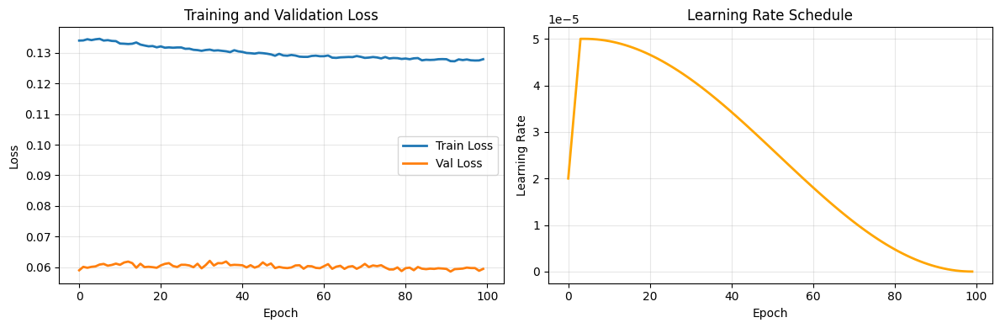


✓ Training complete! Models saved:
  - 200lejepa_best.pth (best validation)
  - 200leepa_latest.pth (latest checkpoint)


In [12]:
# ==========================================
# 8. MAIN EXECUTION
# ==========================================
if __name__ == "__main__":
    print("=" * 60)
    print("COSMIC-JEPA Training Script")
    print("=" * 60)
    
    # Train the model
    model, history = train()
    
    # Plot results if training completed
    if model is not None and history is not None:
        print("\nPlotting training history...")
        plot_training_history(history)
        
        print("\n✓ Training complete! Models saved:")
        print("  - 200lejepa_best.pth (best validation)")
        print("  - 200leepa_latest.pth (latest checkpoint)")

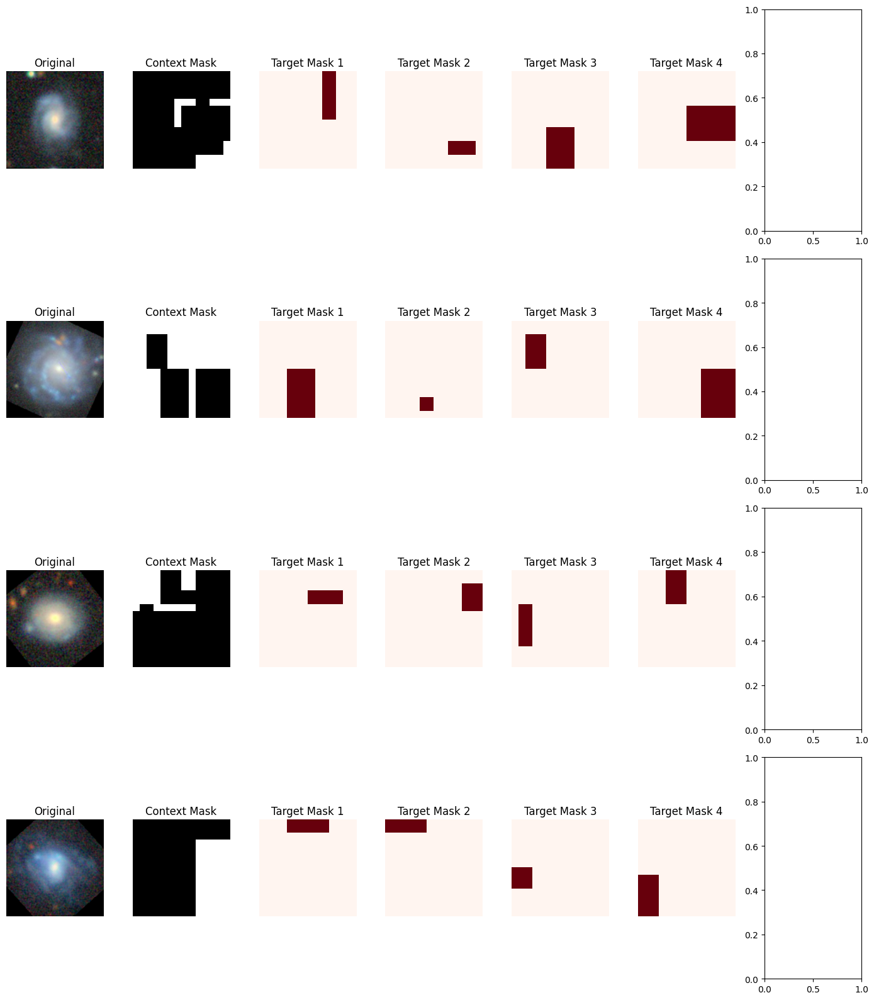

In [13]:
import matplotlib.pyplot as plt
import numpy as np
import torch

def show_batch_from_loader(dataloader, num_samples=4, patch_size=16):
    """
    Visualize a few samples from your JEPA dataloader.
    Shows:
      - Original image
      - Context mask
      - Target masks
    """

    # Get ONE batch
    images, context_mask, target_masks = next(iter(dataloader))

    # Move to CPU numpy
    imgs = images.cpu()
    ctx = context_mask.cpu()
    tgts = [m.cpu() for m in target_masks]

    B = imgs.size(0)
    num_samples = min(num_samples, B)

    # Helper to denormalize for display
    def to_img(t):
        t = t.permute(1,2,0).numpy()
        return (t - t.min()) / (t.max() - t.min() + 1e-5)

    # Patch grid dims
    H = W = int(np.sqrt(ctx.size(1)))

    fig, axes = plt.subplots(num_samples, 3 + len(tgts), figsize=(14, 4*num_samples))

    if num_samples == 1:
        axes = axes.reshape(1, -1)

    for i in range(num_samples):
        # ---------------------------
        # Original Image
        # ---------------------------
        img = to_img(imgs[i])
        axes[i, 0].imshow(img)
        axes[i, 0].set_title("Original")
        axes[i, 0].axis("off")

        # ---------------------------
        # Context Mask
        # ---------------------------
        ctx_mask = ctx[i].reshape(H, W)
        axes[i, 1].imshow(ctx_mask, cmap='gray')
        axes[i, 1].set_title("Context Mask")
        axes[i, 1].axis("off")

        # ---------------------------
        # Target Masks
        # ---------------------------
        for j, tm in enumerate(tgts):
            t_mask = tm[i].reshape(H, W)
            axes[i, 2 + j].imshow(t_mask, cmap="Reds")
            axes[i, 2 + j].set_title(f"Target Mask {j+1}")
            axes[i, 2 + j].axis("off")

    plt.tight_layout()
    plt.show()


# -----------------------------
# HOW TO USE THIS
# -----------------------------
# Assuming you have your dataloader defined as train_loader or test_loader:

show_batch_from_loader(train_loader, num_samples=4, patch_size=16)


In [14]:
def load_jepa_checkpoint(path, device='cuda'):
    ckpt = torch.load(path, map_location=device, weights_only=False)
    config = ckpt['config']

    model = MiniJEPA(config).to(device)
    model.load_state_dict(ckpt['model_state_dict'])
    model.eval()

    print("Loaded:", path)
    print("Epoch:", ckpt.get('epoch'))
    print("Best Val Loss:", ckpt.get('val_loss'))
    print("Trainable Params:", model.count_parameters())

    return model, config

def visualize_full_latent_map(model, dataset, device='cuda'):
    import matplotlib.pyplot as plt
    import numpy as np
    import torch.nn.functional as F
    from __main__ import IJepaMaskCollator

    model.eval()

    collator = IJepaMaskCollator(
        input_size=model.config['img_size'],
        patch_size=model.config['patch_size'],
        enc_mask_scale=model.config['context_scale'],
        pred_mask_scale=model.config['mask_scale'],
        num_targets=1
    )

    # 1. pick a random galaxy
    idx = np.random.randint(0, len(dataset))
    img, _ = dataset[idx]  # img is CHW

    # 2. collate
    images, ctx_mask, tgt_masks = collator([(img, 0)])
    images = images.to(device)
    ctx_mask = ctx_mask.to(device)
    tgt_mask = tgt_masks[0].to(device).bool()   # shape [1, N]

    with torch.no_grad():
        target_emb = model.forward_target(images)[0]           # (N, C)
        context_emb = model.forward_context(images, ctx_mask)[0]
        pred_emb = model.forward_predictor(context_emb.unsqueeze(0), 
                                           [tgt_mask])[0][0]   # FIXED

    N, C = target_emb.shape
    grid = int(np.sqrt(N))

    # per patch cosine similarity
    pred_norm = F.normalize(pred_emb, dim=-1)
    tgt_norm = F.normalize(target_emb, dim=-1)
    cos = (pred_norm * tgt_norm).sum(-1).cpu().numpy()

    # per patch mse
    mse = ((pred_emb - target_emb)**2).mean(-1).cpu().numpy()

    cos_map = cos.reshape(grid, grid)
    mse_map = mse.reshape(grid, grid)

    fig, axes = plt.subplots(1, 3, figsize=(20, 6))

    axes[0].imshow(img.permute(1,2,0))
    axes[0].set_title("Original Galaxy")
    axes[0].axis("off")

    im1 = axes[1].imshow(cos_map, cmap='viridis', vmin=-1, vmax=1)
    axes[1].set_title("Patch Cosine Similarity")
    axes[1].axis("off")
    fig.colorbar(im1, ax=axes[1])

    im2 = axes[2].imshow(mse_map, cmap='magma')
    axes[2].set_title("Patch MSE")
    axes[2].axis("off")
    fig.colorbar(im2, ax=axes[2])

    plt.tight_layout()
    plt.show()

    print("Avg Cosine:", cos.mean())
    print("Avg MSE:", mse.mean())


In [15]:
# model, config = load_jepa_checkpoint(path='/kaggle/input/300lejepa-latest/pytorch/default/1/200lejepa_latest.pth')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


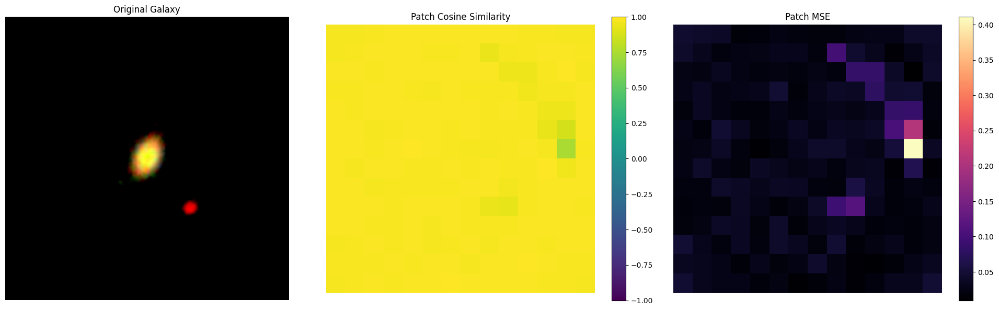

Avg Cosine: 0.9804388
Avg MSE: 0.03414753


In [16]:
visualize_full_latent_map(model, test_subset)

In [17]:

class JEPAFeatureExtractor(nn.Module):
    def __init__(self, jepa_model):
        super().__init__()
        self.model = jepa_model
        self.model.eval()

        for p in self.model.parameters():
            p.requires_grad = False

    @torch.no_grad()
    def forward(self, x):
        # x: (B, 3, H, W)
        z = self.model.forward_target(x)      # (B, N, C)
        z = z.mean(dim=1)                     # global average pool → (B, C)
        return z

class LinearProbe(nn.Module):
    def __init__(self, embed_dim, num_classes):
        super().__init__()
        self.fc = nn.Linear(embed_dim, num_classes)

    def forward(self, x):
        return self.fc(x)

num_classes = 10
embed_dim = CONFIG['embed_dim']

def train_linear_probe(
    jepa_model,
    train_loader,
    test_loader,
    device,
    epochs=30,
    lr=1e-3
):
    feature_extractor = JEPAFeatureExtractor(jepa_model).to(device)
    classifier = LinearProbe(CONFIG['embed_dim'], 10).to(device)

    optimizer = torch.optim.AdamW(classifier.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()

    for epoch in range(epochs):
        # --------------------
        # Train
        # --------------------
        classifier.train()
        train_loss, train_correct, train_total = 0, 0, 0

        for imgs, labels in train_loader:
            imgs = imgs.to(device)
            labels = labels.to(device)

            with torch.no_grad():
                feats = feature_extractor(imgs)

            logits = classifier(feats)
            loss = criterion(logits, labels)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_correct += (logits.argmax(1) == labels).sum().item()
            train_total += labels.size(0)

        train_acc = train_correct / train_total

        # --------------------
        # Eval
        # --------------------
        classifier.eval()
        test_correct, test_total = 0, 0

        with torch.no_grad():
            for imgs, labels in test_loader:
                imgs = imgs.to(device)
                labels = labels.to(device)

                feats = feature_extractor(imgs)
                logits = classifier(feats)

                test_correct += (logits.argmax(1) == labels).sum().item()
                test_total += labels.size(0)

        test_acc = test_correct / test_total

        print(
            f"Epoch [{epoch+1:02d}/{epochs}] | "
            f"Train Acc: {train_acc:.4f} | "
            f"Test Acc: {test_acc:.4f}"
        )

    return classifier



In [18]:
probe_train_loader = DataLoader(
    train_subset,
    batch_size=256,
    shuffle=True,
    num_workers=4,
    pin_memory=True
)

probe_test_loader = DataLoader(
    test_subset,
    batch_size=256,
    shuffle=False,
    num_workers=4,
    pin_memory=True
)



In [19]:
classifier = train_linear_probe(
    model,
    probe_train_loader,
    probe_test_loader,
    CONFIG['device'],
    epochs=30
)

Epoch [01/30] | Train Acc: 0.1996 | Test Acc: 0.2723
Epoch [02/30] | Train Acc: 0.2965 | Test Acc: 0.3382
Epoch [03/30] | Train Acc: 0.3548 | Test Acc: 0.3726
Epoch [04/30] | Train Acc: 0.3790 | Test Acc: 0.4059
Epoch [05/30] | Train Acc: 0.4037 | Test Acc: 0.4070
Epoch [06/30] | Train Acc: 0.4163 | Test Acc: 0.4132
Epoch [07/30] | Train Acc: 0.4254 | Test Acc: 0.4408
Epoch [08/30] | Train Acc: 0.4328 | Test Acc: 0.4487
Epoch [09/30] | Train Acc: 0.4415 | Test Acc: 0.4526
Epoch [10/30] | Train Acc: 0.4444 | Test Acc: 0.4476
Epoch [11/30] | Train Acc: 0.4527 | Test Acc: 0.4594
Epoch [12/30] | Train Acc: 0.4612 | Test Acc: 0.4707
Epoch [13/30] | Train Acc: 0.4620 | Test Acc: 0.4707
Epoch [14/30] | Train Acc: 0.4671 | Test Acc: 0.4679
Epoch [15/30] | Train Acc: 0.4701 | Test Acc: 0.4786
Epoch [16/30] | Train Acc: 0.4741 | Test Acc: 0.4820
Epoch [17/30] | Train Acc: 0.4764 | Test Acc: 0.4893
Epoch [18/30] | Train Acc: 0.4780 | Test Acc: 0.4893
Epoch [19/30] | Train Acc: 0.4813 | Test Acc: 

In [20]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import torch.nn.functional as F

def visualize_full_latent_map(model, dataset, device='cuda', idx=32):

    device = torch.device(device if torch.cuda.is_available() else 'cpu')

    model = model.to(device)
    model.eval()

    collator = IJepaMaskCollator(
        input_size=model.config['img_size'],
        patch_size=model.config['patch_size'],
        enc_mask_scale=model.config['context_scale'],
        pred_mask_scale=model.config['mask_scale'],
        num_targets=1
    )

    # 1. fetch sample
    img, _ = dataset[idx]           # CHW tensor
    img = img.to(device)            # <<< FIX #1

    # 2. collate
    images, ctx_mask, tgt_masks = collator([(img.cpu(), 0)])
    # collator returns CPU tensors, move them to CUDA
    images = images.to(device)      # <<< FIX #2
    ctx_mask = ctx_mask.to(device)
    tgt_mask = tgt_masks[0].to(device).bool()

    with torch.no_grad():
        target_emb  = model.forward_target(images)[0]           # (N, C)
        context_emb = model.forward_context(images, ctx_mask)[0]
        pred_emb    = model.forward_predictor(
                            context_emb.unsqueeze(0),
                            [tgt_mask]
                      )[0][0]

    N, C = target_emb.shape
    grid = int(np.sqrt(N))

    # reshape masks
    ctx_mask_img = ctx_mask[0].reshape(grid, grid).cpu().numpy()
    tgt_mask_img = tgt_mask[0].reshape(grid, grid).cpu().numpy()

    # cosine similarity
    pred_norm = F.normalize(pred_emb, dim=-1)
    tgt_norm  = F.normalize(target_emb, dim=-1)
    cos = (pred_norm * tgt_norm).sum(-1).detach().cpu().numpy()

    # mse
    mse = ((pred_emb - target_emb)**2).mean(-1).detach().cpu().numpy()

    cos_map = cos.reshape(grid, grid)
    mse_map = mse.reshape(grid, grid)

    # ===============================================
    # PLOT EVERYTHING
    # ===============================================

    fig, axes = plt.subplots(1, 5, figsize=(28, 6))

    # original galaxy
    axes[0].imshow(img.detach().cpu().permute(1,2,0))
    axes[0].set_title("Original Galaxy")
    axes[0].axis("off")

    axes[1].imshow(ctx_mask_img, cmap='Greens')
    axes[1].set_title("Context Mask (Seen)")
    axes[1].axis("off")

    axes[2].imshow(tgt_mask_img, cmap='Reds')
    axes[2].set_title("Target Mask (Predicted)")
    axes[2].axis("off")

    im1 = axes[3].imshow(cos_map, cmap='viridis', vmin=-1, vmax=1)
    axes[3].set_title("Patch Cosine Similarity")
    axes[3].axis("off")
    fig.colorbar(im1, ax=axes[3])

    im2 = axes[4].imshow(mse_map, cmap='magma')
    axes[4].set_title("Patch MSE")
    axes[4].axis("off")
    fig.colorbar(im2, ax=axes[4])

    plt.tight_layout()
    plt.show()

    print("\nIndex:", idx)
    print("Avg Cosine:", cos.mean())
    print("Avg MSE:", mse.mean())


In [21]:
import torch
import torch.nn.functional as F
import numpy as np
import pandas as pd
from tqdm import tqdm




@torch.no_grad()
def compute_jepa_anomaly_scores(
    model,
    dataset,
    batch_size=64,
    device="cuda",
    save_path=None
):
    """
    Compute per-galaxy anomaly scores using JEPA latent prediction error.

    For each image:
      - use IJepaMaskCollator to sample context & target blocks
      - run target encoder, context encoder, predictor
      - compute cosine similarity and MSE on MASKED patches only
      - aggregate:
          mean_mse, max_mse, mean_cos, min_cos, num_masked_patches
      - combine into a scalar anomaly_score

    Returns:
      df: pandas DataFrame with one row per image in `dataset`.
    """

    device = torch.device(device if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    model.eval()

    # masking config from model
    img_size = model.config["img_size"]
    patch_size = model.config["patch_size"]
    context_scale = model.config["context_scale"]
    mask_scale = model.config["mask_scale"]
    num_targets = model.config["num_targets"]
    min_ctx = model.config.get("min_context_patches", 8)

    collator = IJepaMaskCollator(
        input_size=img_size,
        patch_size=patch_size,
        enc_mask_scale=context_scale,
        pred_mask_scale=mask_scale,
        num_targets=num_targets,
        min_context_patches=min_ctx,
    )

    num_samples = len(dataset)

    rows = {
        "index": [],
        "label": [],
        "mean_mse": [],
        "max_mse": [],
        "mean_cos": [],
        "min_cos": [],
        "num_masked_patches": [],
        "anomaly_score": [],
    }

    print(f"Computing anomaly scores on {num_samples} images using {device}.")

    for start in tqdm(range(0, num_samples, batch_size)):
        end = min(start + batch_size, num_samples)

        # manual mini-batch from dataset
        batch_samples = [dataset[i] for i in range(start, end)]
        imgs = [x[0] for x in batch_samples]
        labels = torch.tensor([int(x[1]) for x in batch_samples])

        images, ctx_mask, tgt_masks = collator(
            [(img, lbl) for img, lbl in zip(imgs, labels)]
        )

        images = images.to(device)
        ctx_mask = ctx_mask.to(device)
        tgt_masks = [m.to(device).bool() for m in tgt_masks]

        # forward passes
        target_emb = model.forward_target(images)              # (B, N, C)
        context_emb = model.forward_context(images, ctx_mask)  # (B, N, C)
        preds_list = model.forward_predictor(context_emb, tgt_masks)
        # preds_list: list of length num_targets, each (B, N, C)

        B, N, C = target_emb.shape

        # collect per image
        per_img_cos = [[] for _ in range(B)]
        per_img_mse = [[] for _ in range(B)]

        for pred_block, mask_block in zip(preds_list, tgt_masks):
            # pred_block: (B, N, C), mask_block: (B, N)
            for b in range(B):
                m = mask_block[b]      # (N,)
                if not m.any():
                    continue

                p = pred_block[b][m]   # (#patch, C)
                t = target_emb[b][m]   # (#patch, C)

                # cosine similarity per patch
                cos_vals = F.cosine_similarity(p, t, dim=-1)  # (#patch,)
                # mse per patch (over embedding dim)
                mse_vals = F.mse_loss(p, t, reduction="none").mean(dim=-1)

                per_img_cos[b].append(cos_vals.cpu())
                per_img_mse[b].append(mse_vals.cpu())

        # aggregate stats and anomaly score
        for local_idx in range(B):
            global_idx = start + local_idx
            label = int(labels[local_idx].item())

            if len(per_img_mse[local_idx]) == 0:
                # nothing masked, should not happen but whatever
                mean_mse = float("nan")
                max_mse = float("nan")
                mean_cos = float("nan")
                min_cos = float("nan")
                num_masked = 0
                anomaly = float("nan")
            else:
                mse_all = torch.cat(per_img_mse[local_idx])    # (K,)
                cos_all = torch.cat(per_img_cos[local_idx])    # (K,)

                mean_mse = mse_all.mean().item()
                max_mse = mse_all.max().item()
                mean_cos = cos_all.mean().item()
                min_cos = cos_all.min().item()
                num_masked = mse_all.numel()

                # simple hand tuned anomaly score:
                #   base on mean error, penalize large peaks, reward low cosine
                anomaly = (
                    mean_mse
                    + 0.5 * max_mse
                    + 0.1 * (1.0 - mean_cos)
                )

            rows["index"].append(global_idx)
            rows["label"].append(label)
            rows["mean_mse"].append(mean_mse)
            rows["max_mse"].append(max_mse)
            rows["mean_cos"].append(mean_cos)
            rows["min_cos"].append(min_cos)
            rows["num_masked_patches"].append(num_masked)
            rows["anomaly_score"].append(anomaly)

    df = pd.DataFrame(rows)
    df = df.sort_values("anomaly_score", ascending=False).reset_index(drop=True)

    if save_path is not None:
        df.to_csv(save_path, index=False)
        print(f"Saved anomaly scores to {save_path}")

    return df


In [22]:
device = "cuda"  # or "cpu"

anomaly_df = compute_jepa_anomaly_scores(
    model,
    test_subset,          # or full_dataset
    batch_size=64,
    device=device,
    save_path="galaxy_anomaly_scores.csv"
)

anomaly_df.head()


Computing anomaly scores on 1774 images using cuda.


100%|██████████| 28/28 [00:10<00:00,  2.61it/s]

Saved anomaly scores to galaxy_anomaly_scores.csv


,index,label,mean_mse,max_mse,mean_cos,min_cos,num_masked_patches,anomaly_score
0,492,3,0.130211,1.477709,0.920517,0.078439,93,0.877014
1,1579,3,0.167892,1.352897,0.896867,0.148366,80,0.854654
2,289,7,0.109335,1.441428,0.933710,0.101780,104,0.836678
3,1164,2,0.125824,1.401169,0.923287,0.122922,79,0.834080
4,502,1,0.169985,1.281582,0.895481,0.193907,107,0.821228


In [23]:
import os

os.makedirs("anomaly_gallery", exist_ok=True)
def save_anomaly_report(model, dataset, idx, score, save_path, device='cuda'):
    plt.figure(figsize=(24, 6))

    # Run your visualization function
    model.eval()
    visualize_full_latent_map(model, dataset, idx=idx, device=device)

    # Save
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.close()

    print(f"Saved report: {save_path}")


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 2400x600 with 0 Axes>

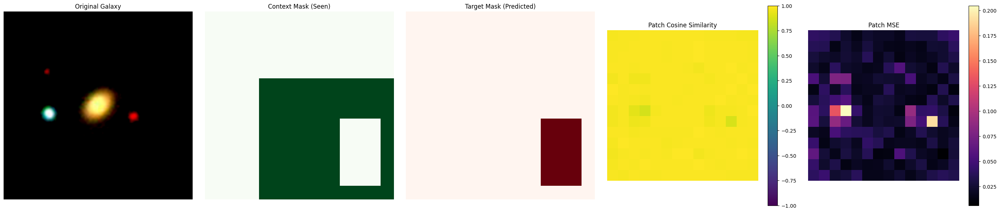

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 492
Avg Cosine: 0.9826439
Avg MSE: 0.030453946
Saved report: anomaly_gallery/anomaly_492_score_0.877.png


<Figure size 2400x600 with 0 Axes>

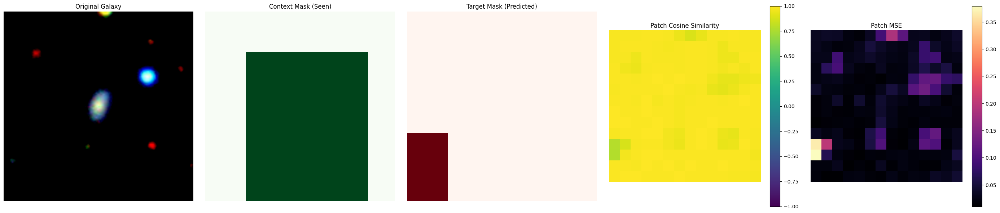

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 1579
Avg Cosine: 0.97785777
Avg MSE: 0.038317535
Saved report: anomaly_gallery/anomaly_1579_score_0.855.png


<Figure size 2400x600 with 0 Axes>

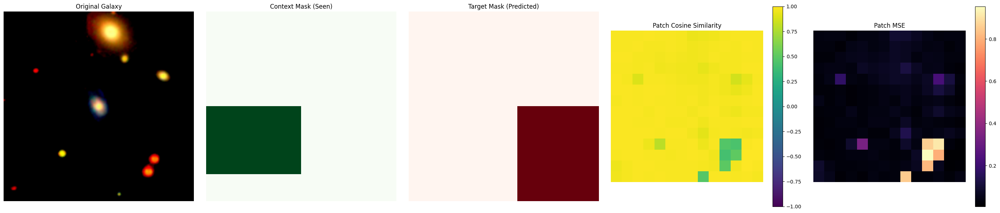

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 289
Avg Cosine: 0.958226
Avg MSE: 0.06991901
Saved report: anomaly_gallery/anomaly_289_score_0.837.png


<Figure size 2400x600 with 0 Axes>

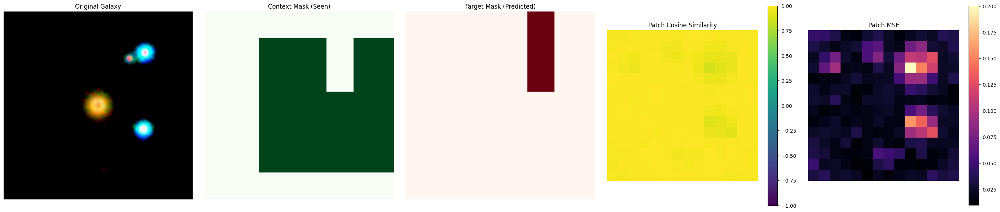

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 1164
Avg Cosine: 0.9801086
Avg MSE: 0.03455424
Saved report: anomaly_gallery/anomaly_1164_score_0.834.png


<Figure size 2400x600 with 0 Axes>

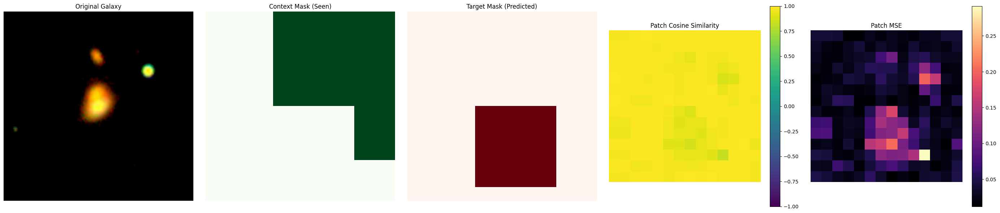

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 502
Avg Cosine: 0.97276616
Avg MSE: 0.04644357
Saved report: anomaly_gallery/anomaly_502_score_0.821.png


<Figure size 2400x600 with 0 Axes>

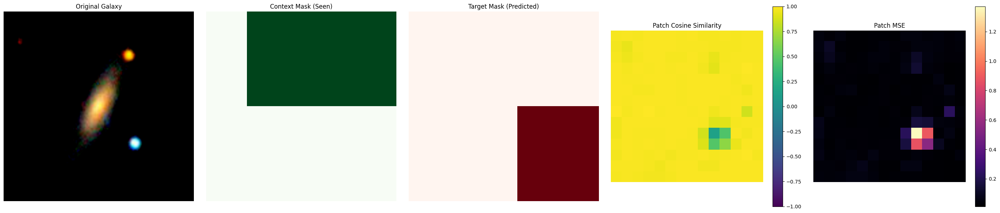

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 1258
Avg Cosine: 0.9671044
Avg MSE: 0.05558069
Saved report: anomaly_gallery/anomaly_1258_score_0.800.png


<Figure size 2400x600 with 0 Axes>

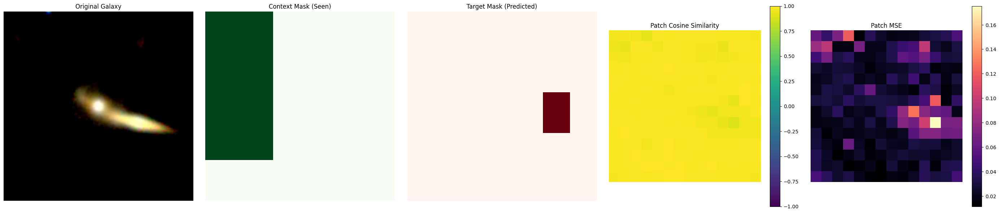

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 1707
Avg Cosine: 0.9804141
Avg MSE: 0.03414685
Saved report: anomaly_gallery/anomaly_1707_score_0.795.png


<Figure size 2400x600 with 0 Axes>

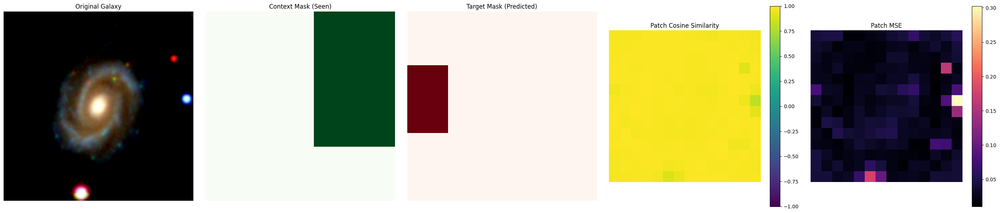

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 783
Avg Cosine: 0.98063296
Avg MSE: 0.03369711
Saved report: anomaly_gallery/anomaly_783_score_0.762.png


<Figure size 2400x600 with 0 Axes>

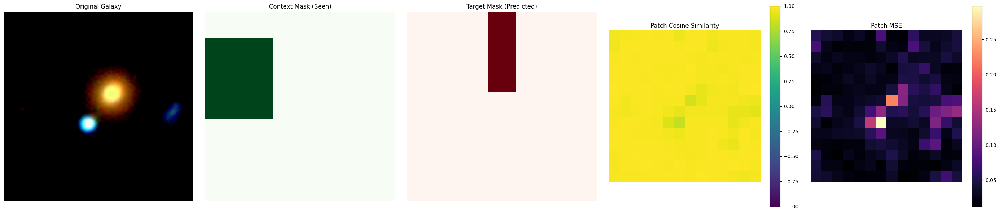

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 1146
Avg Cosine: 0.9768334
Avg MSE: 0.03989612
Saved report: anomaly_gallery/anomaly_1146_score_0.759.png


<Figure size 2400x600 with 0 Axes>

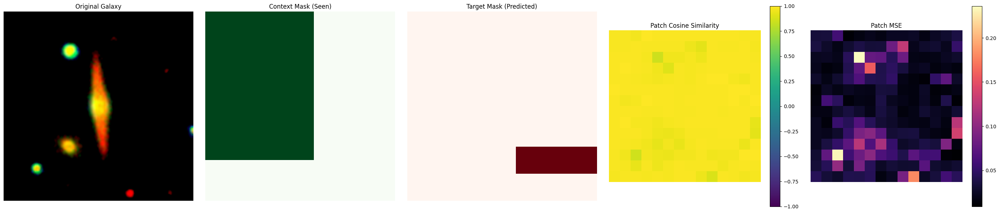


Index: 1188
Avg Cosine: 0.97629803
Avg MSE: 0.040765863
Saved report: anomaly_gallery/anomaly_1188_score_0.753.png


In [24]:
top_k = anomaly_df.sort_values("anomaly_score", ascending=False).head(10)

for i, row in top_k.iterrows():
    idx = int(row["index"])
    score = float(row["anomaly_score"])

    save_path = f"anomaly_gallery/anomaly_{idx}_score_{score:.3f}.png"
    save_anomaly_report(model, test_subset, idx, score, save_path, device='cuda')



In [25]:
import torch
from torch.utils.data import DataLoader
import numpy as np
from tqdm import tqdm

def extract_latents(model, dataset, device='cuda', batch_size=64):
    """
    Extracts latents from a model and dataset.
    """
    # specific check to avoid cuda errors if user forgot to check availability
    device = torch.device(device if torch.cuda.is_available() else 'cpu')
    
    model.to(device)
    model.eval()
    
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

    latents = []
    labels = []

    with torch.no_grad():
        for imgs, lbls in tqdm(loader, desc="Extracting Latents"):
            imgs = imgs.to(device)
            
            # Assuming model.forward_target exists as per your snippet
            z = model.forward_target(imgs)   # (B, N, C)
            z = z.mean(dim=1)                # pooled representation (B, C)
            
            latents.append(z.cpu().numpy())
            labels.append(lbls.numpy())

    latents = np.concatenate(latents, axis=0)
    labels = np.concatenate(labels, axis=0)

    # CRITICAL FIX: Cast to float32 HERE, before returning. 
    # This prevents memory bloat and ensures compatibility with UMAP immediately.
    latents = latents.astype(np.float32)

    return latents, labels



In [26]:
latents, labels = extract_latents(model, test_subset)


Extracting Latents: 100%|██████████| 28/28 [00:03<00:00,  7.63it/s]


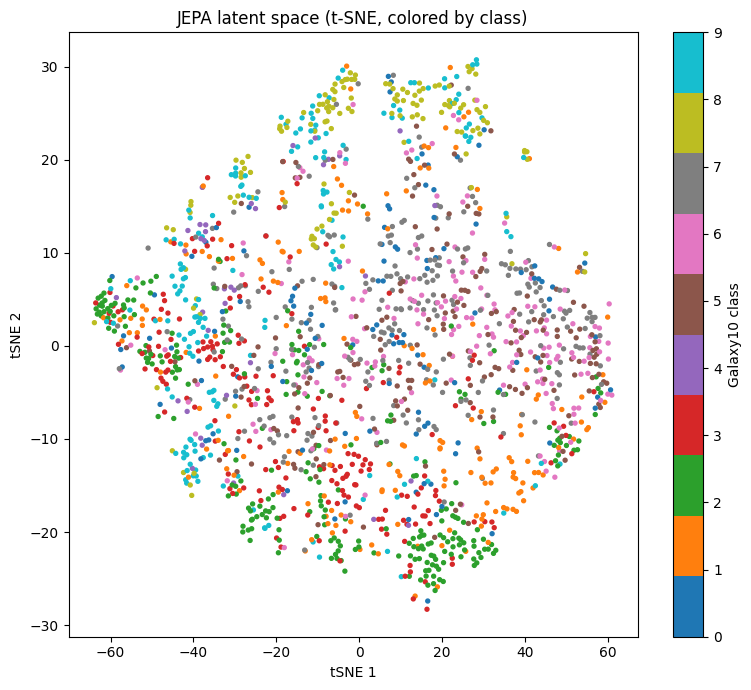

In [27]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

X = latents.astype(np.float32)

tsne = TSNE(
    n_components=2,
    perplexity=30,
    learning_rate=200,
    n_iter=1000,
    metric='cosine',
    random_state=42,
    init='random'
)

embedding_tsne = tsne.fit_transform(X)

plt.figure(figsize=(8, 7))
sc = plt.scatter(
    embedding_tsne[:, 0],
    embedding_tsne[:, 1],
    c=labels,
    s=8,
    cmap='tab10'
)
plt.colorbar(sc, label='Galaxy10 class')
plt.title('JEPA latent space (t-SNE, colored by class)')
plt.xlabel('tSNE 1')
plt.ylabel('tSNE 2')
plt.tight_layout()
plt.show()


In [28]:
# anomaly_df has a column "index" which is dataset index
# sort back by that to match latent order
aligned = anomaly_df.sort_values("index")

anomaly_scores = aligned["anomaly_score"].to_numpy().astype(np.float32)

# sanity check
print(latents.shape[0], anomaly_scores.shape[0])


1774 1774


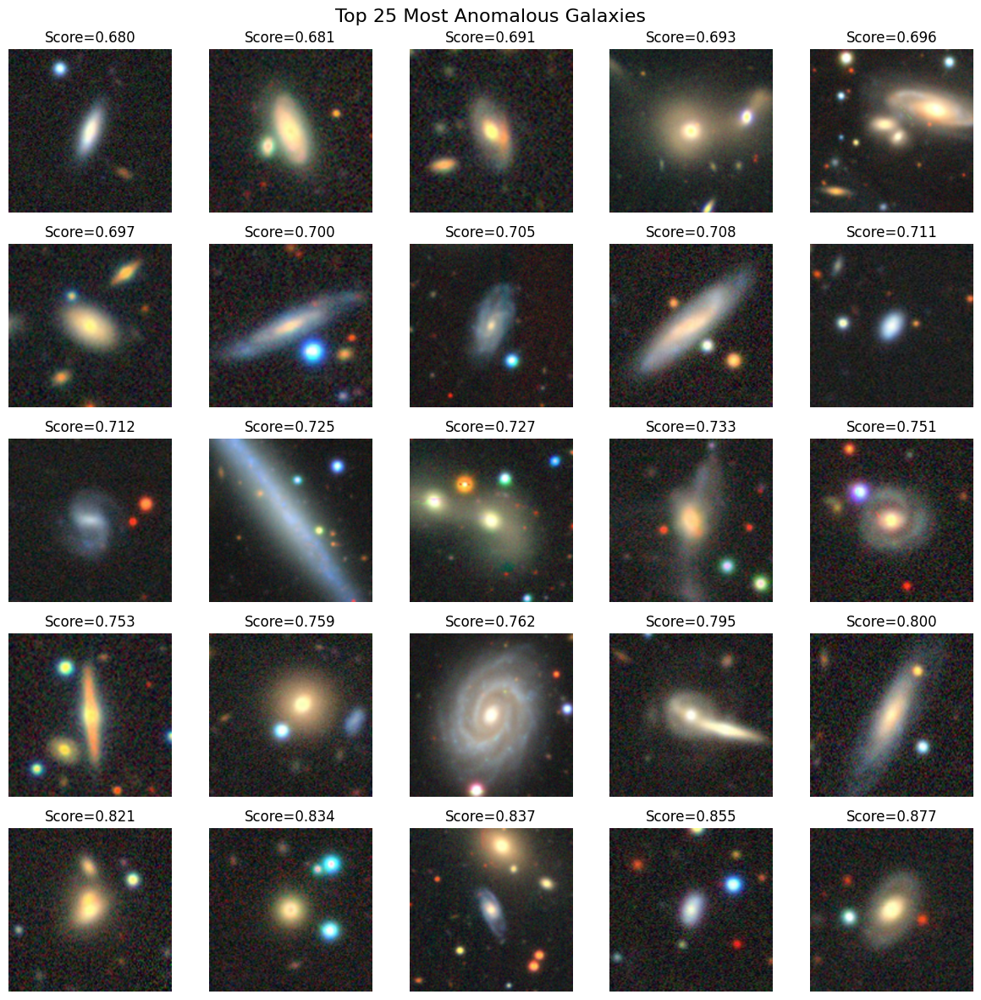

In [29]:
import matplotlib.pyplot as plt

# pick top K anomaly samples
K = 25
top_idx = np.argsort(anomaly_scores)[-K:]

rows, cols = 5, 5
plt.figure(figsize=(12,12))

for i, idx in enumerate(top_idx):
    img, _ = test_subset[idx]
    img_np = img.permute(1,2,0).numpy()
    img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min() + 1e-6)

    plt.subplot(rows, cols, i+1)
    plt.imshow(img_np)
    plt.title(f"Score={anomaly_scores[idx]:.3f}")
    plt.axis("off")

plt.suptitle("Top 25 Most Anomalous Galaxies", fontsize=16)
plt.tight_layout()
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



=== Visualizing anomaly at index 206 ===


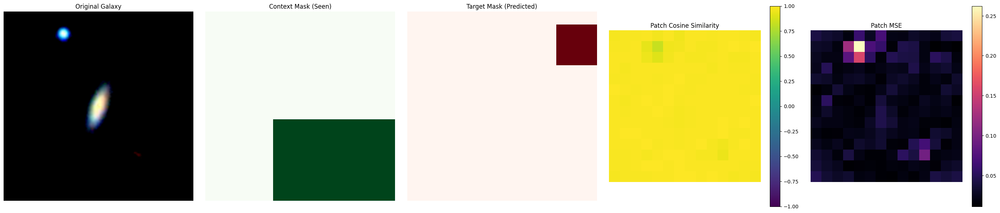

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 206
Avg Cosine: 0.98348546
Avg MSE: 0.029168561

=== Visualizing anomaly at index 278 ===


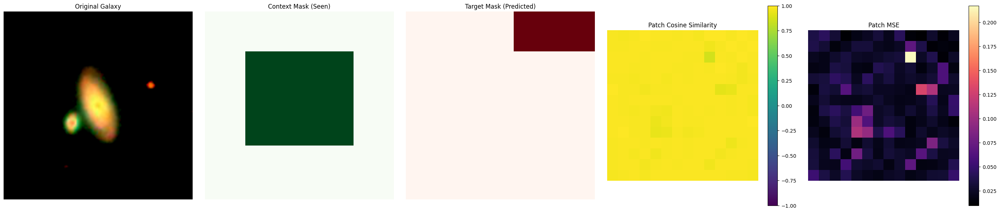

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 278
Avg Cosine: 0.98160803
Avg MSE: 0.03220529

=== Visualizing anomaly at index 476 ===


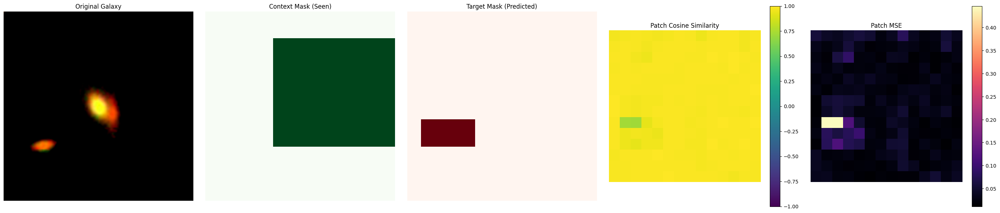


Index: 476
Avg Cosine: 0.9793139
Avg MSE: 0.035801448

=== Visualizing anomaly at index 205 ===


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


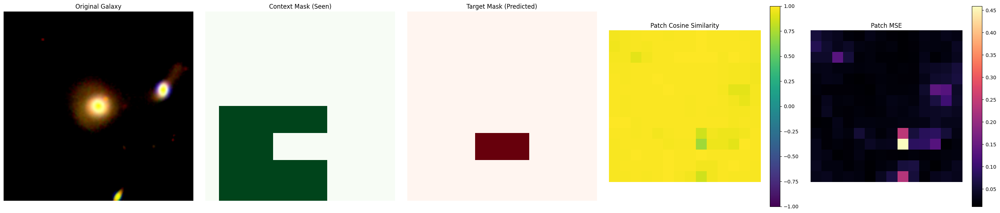

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 205
Avg Cosine: 0.9792414
Avg MSE: 0.03595031

=== Visualizing anomaly at index 846 ===


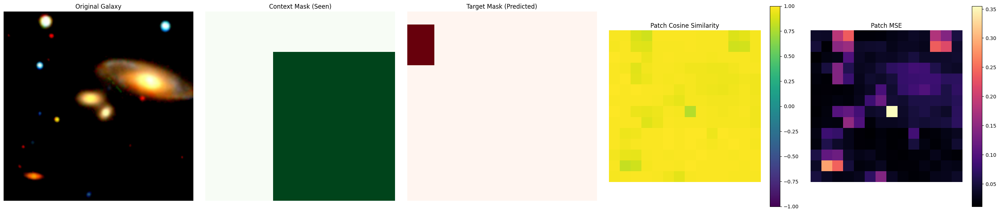

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 846
Avg Cosine: 0.9693015
Avg MSE: 0.052152596

=== Visualizing anomaly at index 808 ===


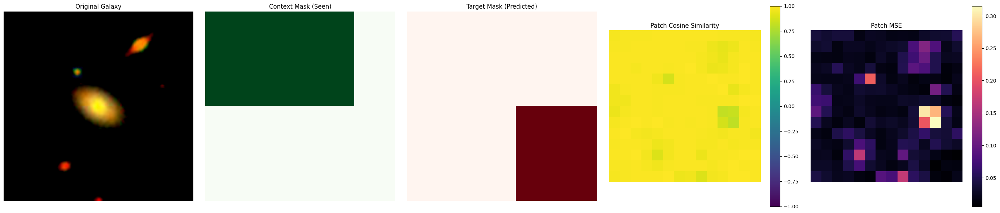

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 808
Avg Cosine: 0.9764384
Avg MSE: 0.040477805

=== Visualizing anomaly at index 809 ===


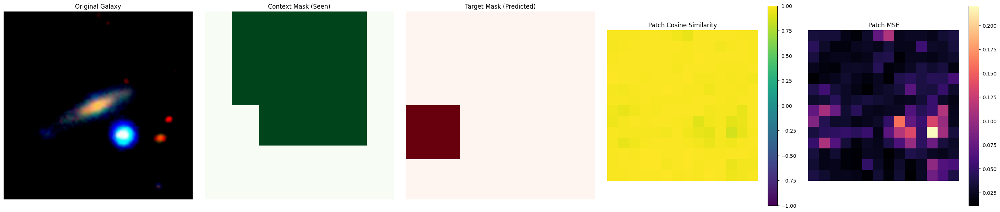

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 809
Avg Cosine: 0.9775526
Avg MSE: 0.0388054

=== Visualizing anomaly at index 657 ===


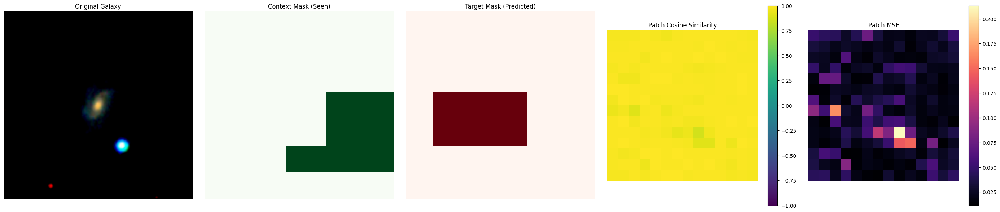

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 657
Avg Cosine: 0.98096144
Avg MSE: 0.03317811

=== Visualizing anomaly at index 357 ===


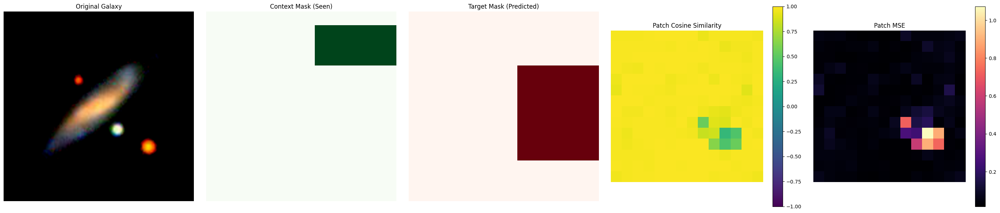

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 357
Avg Cosine: 0.95969874
Avg MSE: 0.0673608

=== Visualizing anomaly at index 570 ===


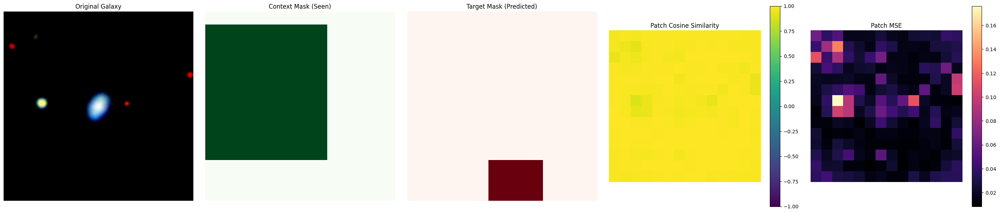

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 570
Avg Cosine: 0.98380387
Avg MSE: 0.028669702

=== Visualizing anomaly at index 1134 ===


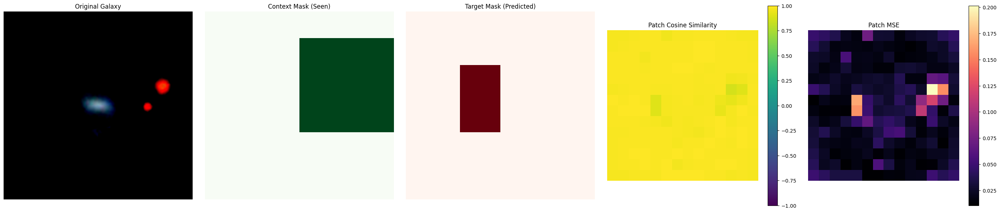

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 1134
Avg Cosine: 0.98243374
Avg MSE: 0.030760376

=== Visualizing anomaly at index 850 ===


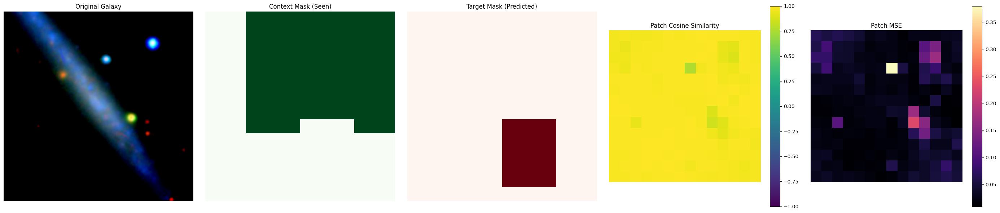

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 850
Avg Cosine: 0.97902393
Avg MSE: 0.036399283

=== Visualizing anomaly at index 1229 ===


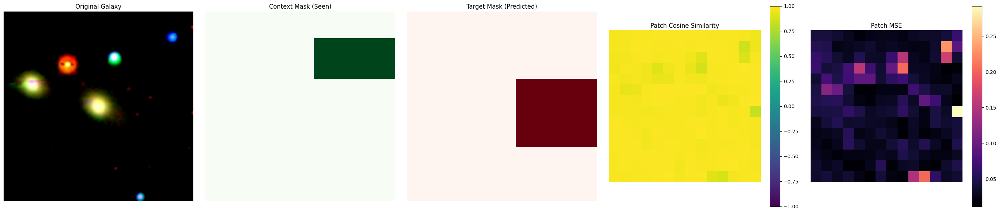

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 1229
Avg Cosine: 0.9747605
Avg MSE: 0.043414153

=== Visualizing anomaly at index 485 ===


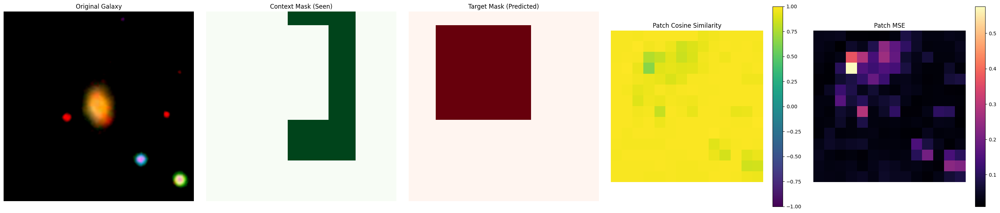

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 485
Avg Cosine: 0.96598697
Avg MSE: 0.057343327

=== Visualizing anomaly at index 1405 ===


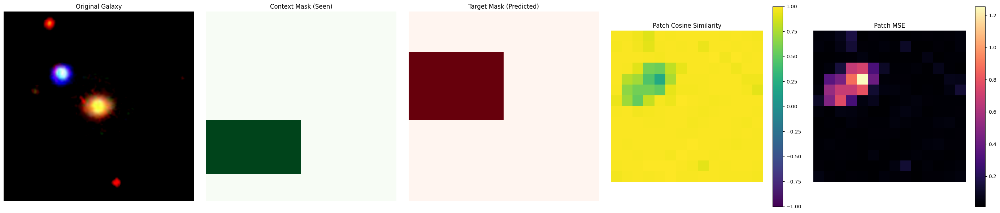

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 1405
Avg Cosine: 0.9525092
Avg MSE: 0.07874705

=== Visualizing anomaly at index 1188 ===


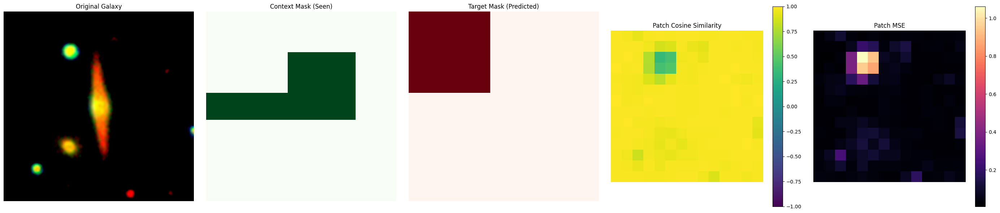

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 1188
Avg Cosine: 0.9606295
Avg MSE: 0.06582912

=== Visualizing anomaly at index 1146 ===


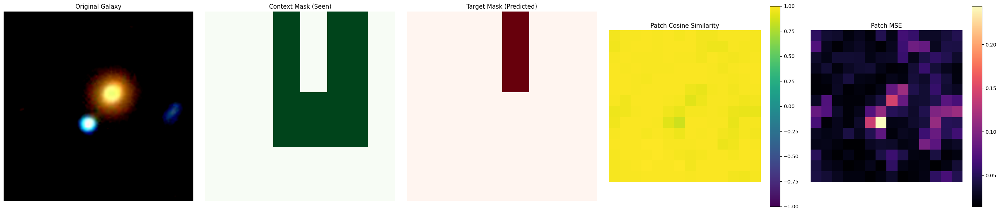

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 1146
Avg Cosine: 0.9769799
Avg MSE: 0.03959953

=== Visualizing anomaly at index 783 ===


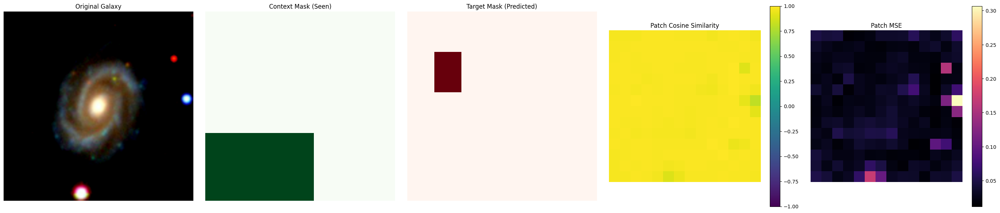

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 783
Avg Cosine: 0.9802084
Avg MSE: 0.03435566

=== Visualizing anomaly at index 1707 ===


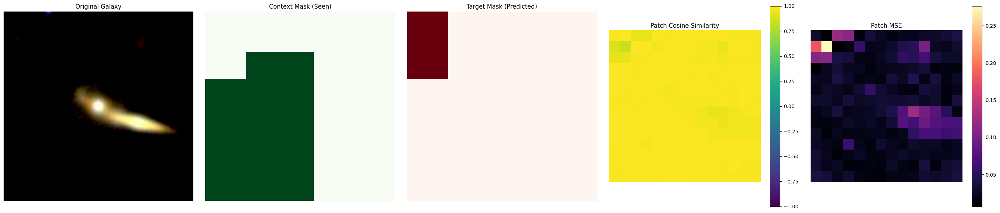

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 1707
Avg Cosine: 0.98065245
Avg MSE: 0.033825498

=== Visualizing anomaly at index 1258 ===


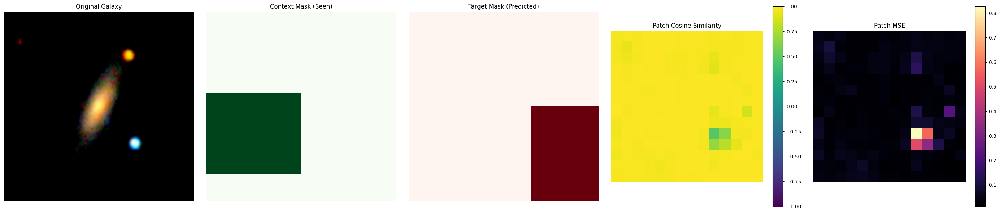

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 1258
Avg Cosine: 0.97275513
Avg MSE: 0.046368673

=== Visualizing anomaly at index 502 ===


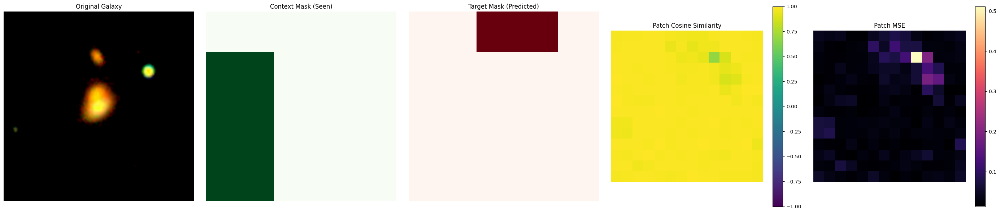

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 502
Avg Cosine: 0.9781323
Avg MSE: 0.037709855

=== Visualizing anomaly at index 1164 ===


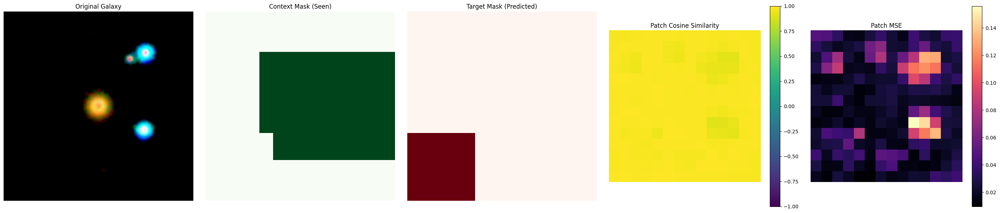

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 1164
Avg Cosine: 0.98040754
Avg MSE: 0.03408875

=== Visualizing anomaly at index 289 ===


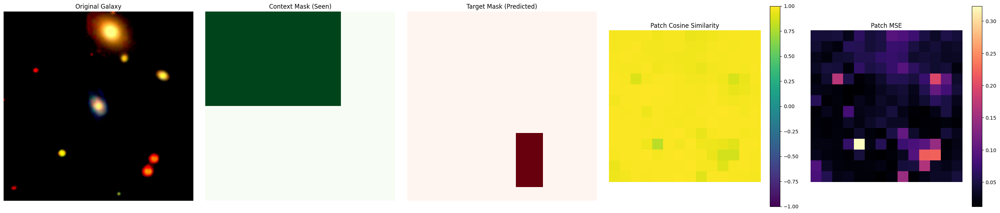


Index: 289
Avg Cosine: 0.9734827
Avg MSE: 0.04520985

=== Visualizing anomaly at index 1579 ===


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


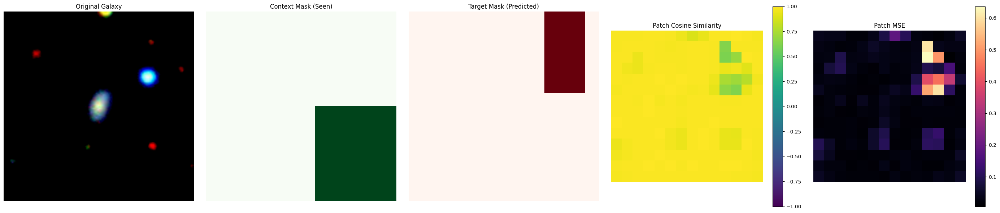

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



Index: 1579
Avg Cosine: 0.9688828
Avg MSE: 0.052339718

=== Visualizing anomaly at index 492 ===


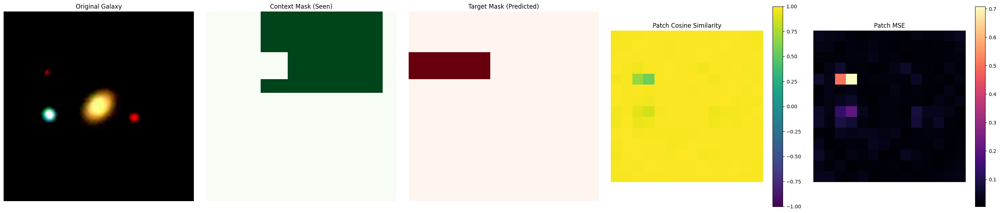


Index: 492
Avg Cosine: 0.9801983
Avg MSE: 0.034331843


In [30]:
for idx in top_idx:
    print(f"\n=== Visualizing anomaly at index {idx} ===")
    visualize_full_latent_map(model, test_subset, idx=idx, device='cuda')


In [31]:
import torch
import numpy as np
from tqdm import tqdm

def kmeans_torch(X, num_clusters=10, num_iters=50, device='cpu'):
    """
    Simple PyTorch KMeans for clustering latent vectors.
    X: numpy array of shape (N, D)
    """
    X = torch.tensor(X, dtype=torch.float32).to(device)
    N, D = X.shape

    # randomly pick initial centroids
    indices = torch.randperm(N)[:num_clusters]
    centroids = X[indices]

    for _ in tqdm(range(num_iters)):
        # compute distances to each centroid
        distances = torch.cdist(X, centroids)

        # assign each point to nearest centroid
        labels = distances.argmin(dim=1)

        # recompute centroids
        new_centroids = []
        for k in range(num_clusters):
            cluster_points = X[labels == k]
            if len(cluster_points) == 0:
                new_centroids.append(centroids[k])
            else:
                new_centroids.append(cluster_points.mean(dim=0))
        centroids = torch.stack(new_centroids)

    return labels.cpu().numpy(), centroids.cpu().numpy()


In [32]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
clusters, centers = kmeans_torch(latents, num_clusters=10, device=device)


100%|██████████| 50/50 [00:00<00:00, 698.75it/s]


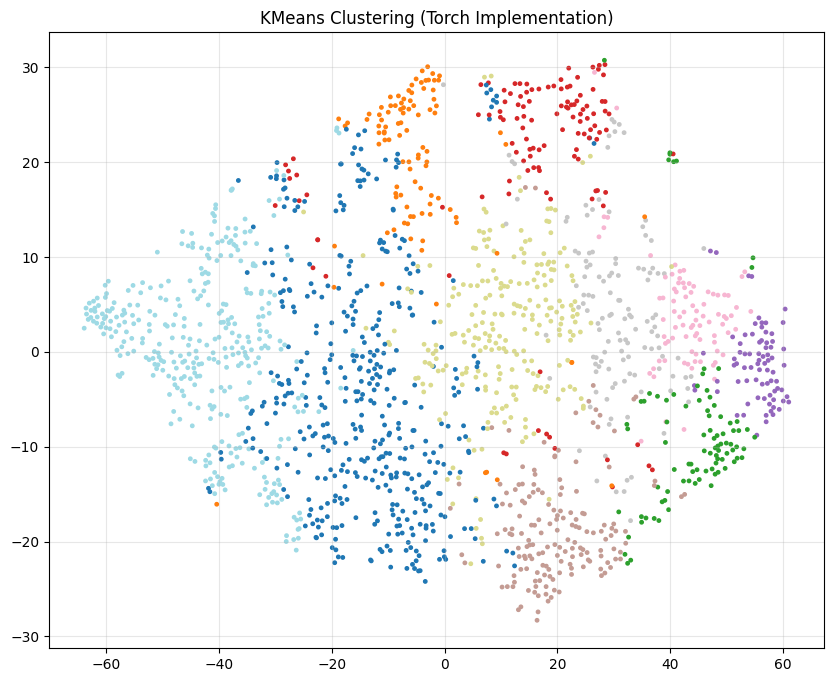

In [33]:
plt.figure(figsize=(10,8))
plt.scatter(
    embedding_tsne[:,0], embedding_tsne[:,1],
    c=clusters, cmap='tab20', s=6
)
plt.title("KMeans Clustering (Torch Implementation)")
plt.grid(alpha=0.3)
plt.show()


In [34]:
import numpy as np
from collections import Counter

true_labels = labels  # from your dataset
cluster_ids = clusters  # from KMeans

num_clusters = len(np.unique(cluster_ids))

print("\n=== Cluster Purity ===\n")
for k in range(num_clusters):
    mask = cluster_ids == k
    assigned = true_labels[mask]
    if len(assigned) == 0:
        continue
    
    counts = Counter(assigned)
    dominant_cls, count = counts.most_common(1)[0]
    purity = count / len(assigned)
    
    print(f"Cluster {k}: size={len(assigned)}, "
          f"dominant={dominant_cls}, purity={purity:.3f}, "
          f"class_counts={dict(counts)}")



=== Cluster Purity ===

Cluster 0: size=428, dominant=3, purity=0.206, class_counts={7: 69, 5: 38, 2: 71, 3: 88, 8: 15, 9: 44, 6: 30, 1: 41, 0: 23, 4: 9}
Cluster 1: size=101, dominant=8, purity=0.426, class_counts={8: 43, 4: 4, 6: 5, 9: 24, 1: 15, 5: 2, 2: 2, 7: 5, 0: 1}
Cluster 2: size=90, dominant=1, purity=0.244, class_counts={6: 14, 3: 6, 5: 11, 1: 22, 2: 20, 8: 4, 7: 6, 0: 2, 9: 5}
Cluster 3: size=120, dominant=8, purity=0.375, class_counts={6: 7, 9: 22, 8: 45, 1: 21, 0: 6, 7: 12, 5: 5, 3: 2}
Cluster 4: size=77, dominant=6, purity=0.312, class_counts={7: 16, 1: 6, 6: 24, 2: 4, 5: 21, 0: 4, 8: 1, 3: 1}
Cluster 5: size=161, dominant=2, purity=0.460, class_counts={0: 11, 2: 74, 1: 25, 3: 30, 9: 7, 6: 1, 5: 8, 7: 3, 4: 2}
Cluster 6: size=86, dominant=7, purity=0.349, class_counts={6: 21, 0: 10, 7: 30, 5: 21, 8: 2, 1: 2}
Cluster 7: size=124, dominant=6, purity=0.266, class_counts={7: 29, 5: 32, 6: 33, 1: 14, 9: 3, 0: 5, 8: 5, 2: 1, 3: 2}
Cluster 8: size=238, dominant=7, purity=0.361, 

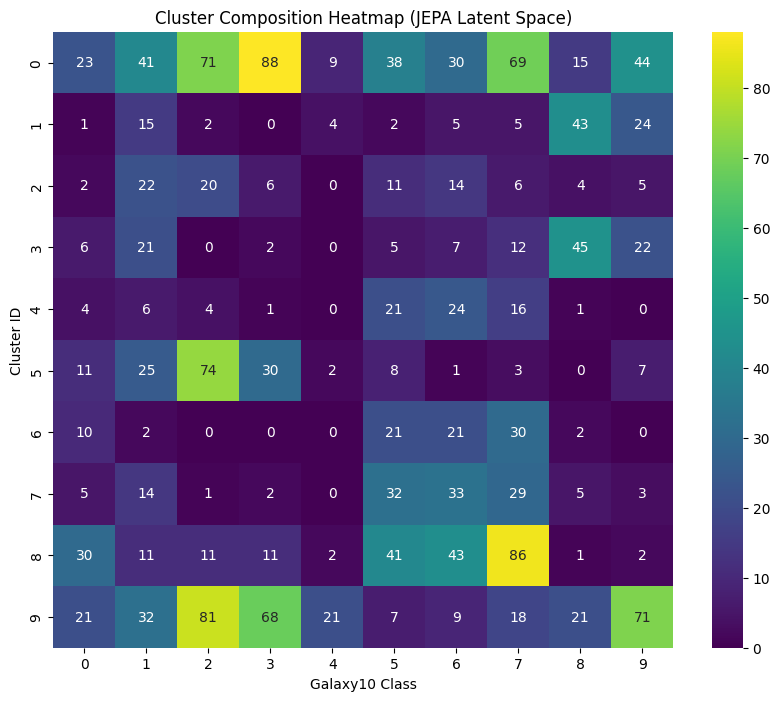

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt

heatmap = np.zeros((10, 10))

for c in range(10):
    for t in range(10):
        heatmap[c, t] = np.sum((clusters == c) & (true_labels == t))

plt.figure(figsize=(10,8))
sns.heatmap(heatmap, annot=True, fmt=".0f", cmap="viridis")
plt.xlabel("Galaxy10 Class")
plt.ylabel("Cluster ID")
plt.title("Cluster Composition Heatmap (JEPA Latent Space)")
plt.show()


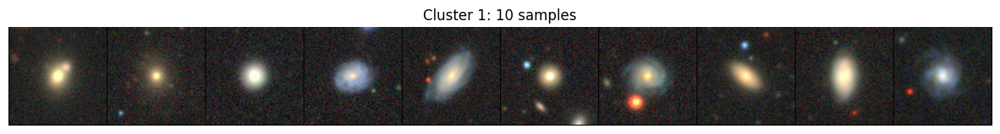

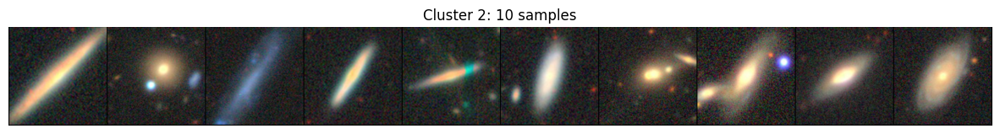

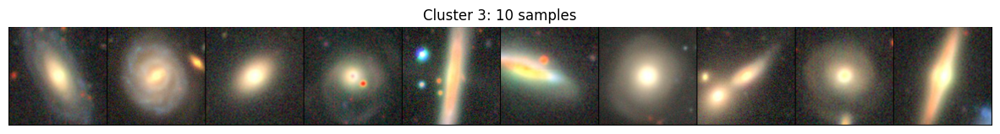

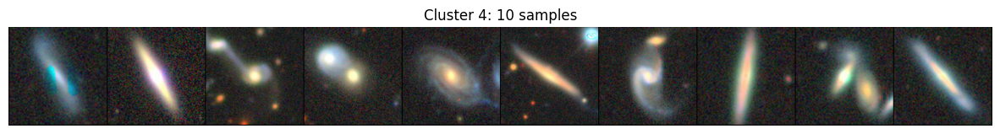

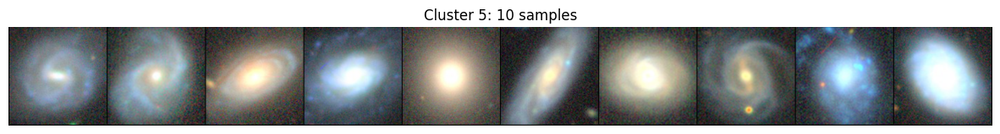

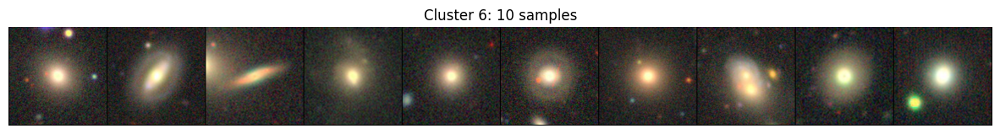

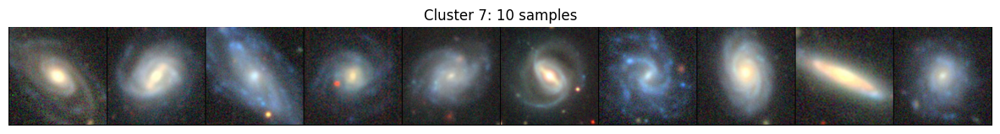

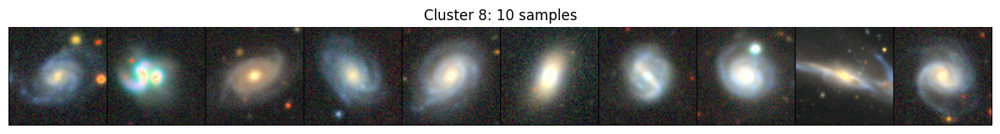

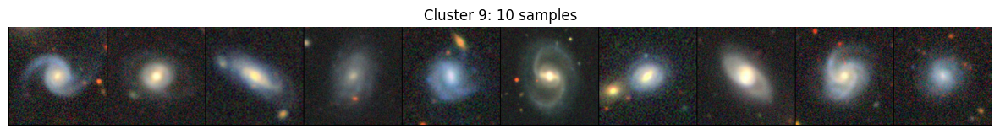

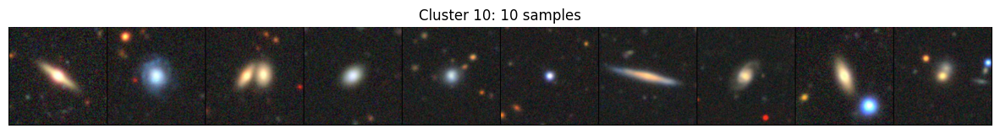

In [36]:
import random
from torchvision.utils import make_grid

def show_cluster_samples(dataset, cluster_ids, cluster, n=10):
    idxs = np.where(cluster_ids == cluster)[0]
    idxs = np.random.choice(idxs, size=min(n, len(idxs)), replace=False)

    imgs = [dataset[i][0] for i in idxs]  # CHW tensors
    imgs = torch.stack(imgs)
    grid = make_grid(imgs, nrow=n, normalize=True)

    plt.figure(figsize=(15,3))
    plt.imshow(grid.permute(1,2,0))
    plt.axis("off")
    plt.title(f"Cluster {cluster+1}: {len(idxs)} samples")
    plt.show()

for c in range(10):
    show_cluster_samples(test_subset, clusters, c)


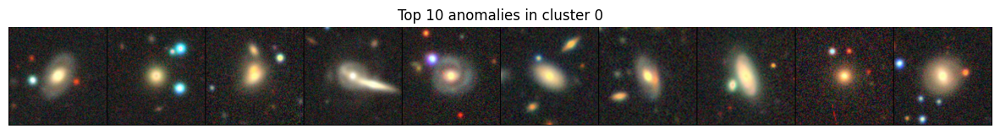

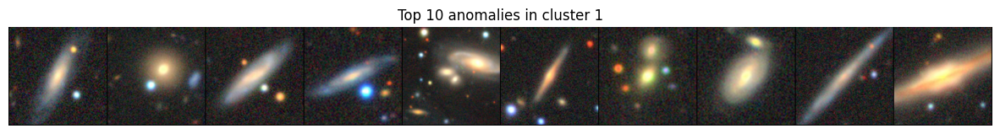

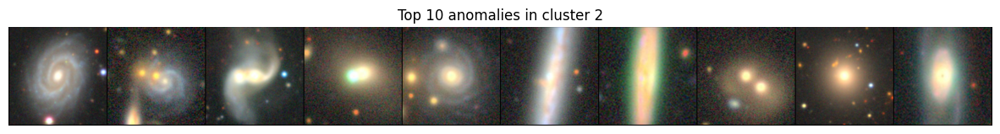

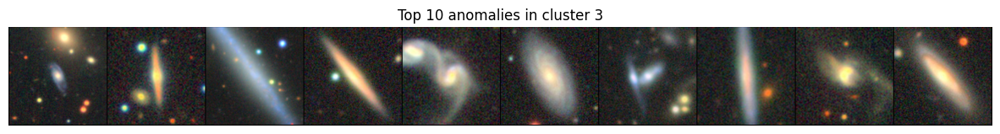

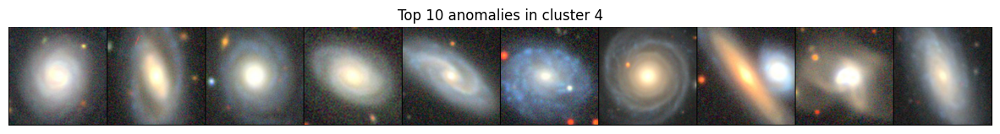

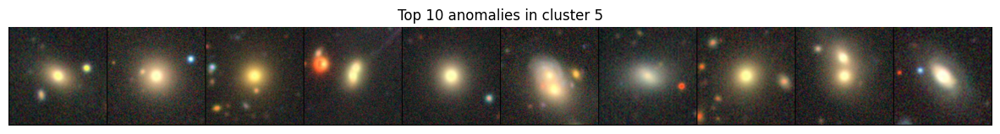

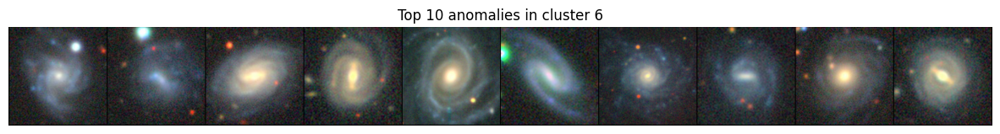

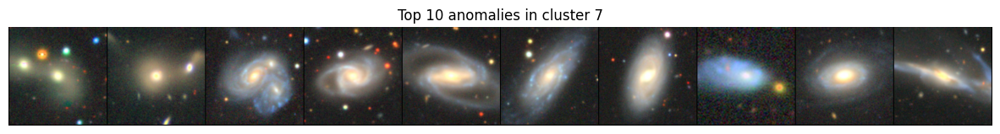

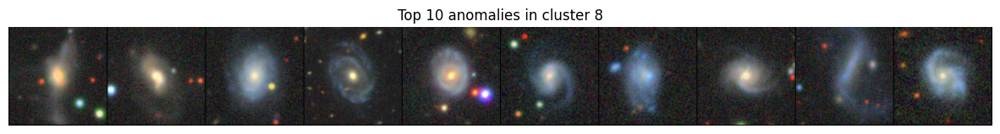

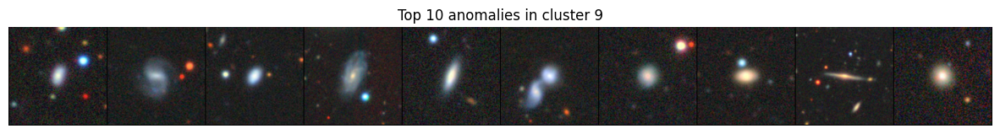

In [37]:
def show_top_anomalies(cluster, top_n=10):
    idxs = np.where(clusters == cluster)[0]
    idxs = idxs[np.argsort(-anomaly_scores[idxs])]  # descending
    top_idxs = idxs[:top_n]

    imgs = [test_subset[i][0] for i in top_idxs]
    imgs = torch.stack(imgs)
    grid = make_grid(imgs, nrow=top_n, normalize=True)

    plt.figure(figsize=(15,3))
    plt.imshow(grid.permute(1,2,0))
    plt.axis("off")
    plt.title(f"Top {top_n} anomalies in cluster {cluster}")
    plt.show()

for c in range(10):
    show_top_anomalies(c)


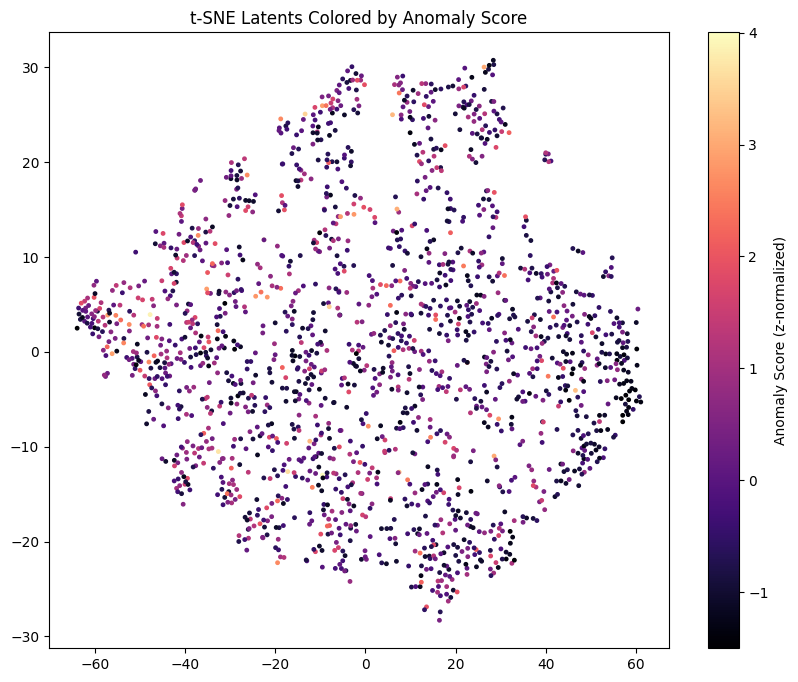

In [38]:
from scipy.stats import zscore

anomaly_scores_z = zscore(anomaly_scores)

plt.figure(figsize=(10,8))
plt.scatter(
    embedding_tsne[:,0], embedding_tsne[:,1],
    c=anomaly_scores_z, cmap="magma", s=6
)
plt.colorbar(label="Anomaly Score (z-normalized)")
plt.title("t-SNE Latents Colored by Anomaly Score")
plt.show()


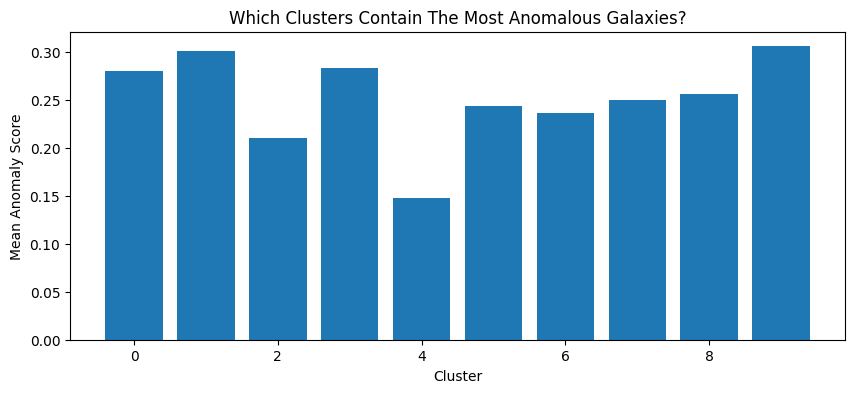

In [39]:
cluster_anomaly_mean = []
for k in range(10):
    mask = clusters == k
    cluster_anomaly_mean.append(anomaly_scores[mask].mean())

plt.figure(figsize=(10,4))
plt.bar(range(10), cluster_anomaly_mean)
plt.xlabel("Cluster")
plt.ylabel("Mean Anomaly Score")
plt.title("Which Clusters Contain The Most Anomalous Galaxies?")
plt.show()
